## Case Study Submission by Saptarshi Ghosh and Nitin Balaji Srinivasan, Cohort 58 - AI and ML

## Telecom Churn Group Case Study

#### Problem Statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from 
one operator to another. In this highly competitive market, the telecommunications industry experiences 
an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than 
to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal. 

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. 
In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify 
customers at high risk of churn, and identify the main indicators of churn.

Customer behaviour during churn:

Customers usually do not decide to switch to another competitor instantly, but rather over a period of time 
(this is especially applicable to high-value customers). 
In churn prediction, we assume that there are three phases of customer lifecycle :

1) The ‘good’ phase: In this phase, the customer is happy with the service and behaves as usual.

2) The ‘action’ phase: The customer experience starts to sore in this phase, for 
    e.g. he/she gets a compelling offer from a competitor, faces unjust charges, 
    becomes unhappy with service quality etc. 
    In this phase, the customer usually shows different behaviour than the ‘good’ months. 
    It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken 
    at this point (such as matching the competitor’s offer/improving the service quality etc.)

3) The ‘churn’ phase: In this phase, the customer is said to have churned. 
    In this case, since you are working over a four-month window, the first month (June) is the ‘good’ phase, 
    the second month (July) is the ‘action’ phase, while the third month (August) is the ‘churn’ phase.

#### Objective:

The main goal of the case study is to build ML models to predict churning customers based on the features provided 
for their usage. 

1) The model will be used to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). 
By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

2) It will be used to identify important variables that are strong predictors of churn. These variables may also indicate 
why customers choose to switch to other networks.

We will use overall accuracy as primary evaluation metric, however we would also calculate other metrics like precision, 
recall, etc. for the different models that can be used for evaluation purposes based on different business objectives. 


One of the key objectives of this ML model is to identify customers who will definitely churn with more accuracy 
as compared to the ones who will not churn. Therefore we will focus on 'Sensitivity' as a key metric 
throughout the comparison of all models

#### Approach:

PCA will be used for dimensionality reduction to predict churning customers but this will not help with 
interpration of the important variables of churn.

Therefore we will build  two models to address the objectives 1) and 2) separately. 

### Steps:
- Data Understanding
- Data Cleansing (Missing data imputation)
- EDA (Univariate--->Bivariate--->Heatmaps)
- Feature Engineering
- Feature Selection (PCA)
- Model Development with PCA (To predict churn) i.e. Logistic Regression->Decision Tree->Random Forest->GDB->XGB->Catboost..SVM
- Model Evaluation  (Sensitivity,Precision,accuracy,AOC)
- Two Final Models (two different approaches)
- Model Development without PCA (To identify important features)


In [1]:
import numpy as np
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.float', '{:.4f}'.format)

In [2]:
#opening the data:
# data=pd.read_csv('/Users/rishismac/telecom-churn-case-study-hackathon-c58/train.csv')
data = pd.read_csv('/Users/rishismac/telecom-churn-case-study-hackathon-c58/train.csv')
print(data.info(verbose=1))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [3]:
#making a dictionary of the missing data percentage :
dict(data.isna().sum()/len(data)*100)

#round(100*houseprice_df.isnull().mean(),2)

{'id': 0.0,
 'circle_id': 0.0,
 'loc_og_t2o_mou': 1.0028714695924228,
 'std_og_t2o_mou': 1.0028714695924228,
 'loc_ic_t2o_mou': 1.0028714695924228,
 'last_date_of_month_6': 0.0,
 'last_date_of_month_7': 0.570008142973471,
 'last_date_of_month_8': 1.0471578165402362,
 'arpu_6': 0.0,
 'arpu_7': 0.0,
 'arpu_8': 0.0,
 'onnet_mou_6': 3.954342204888641,
 'onnet_mou_7': 3.8386262660895154,
 'onnet_mou_8': 5.2900755725081785,
 'offnet_mou_6': 3.954342204888641,
 'offnet_mou_7': 3.8386262660895154,
 'offnet_mou_8': 5.2900755725081785,
 'roam_ic_mou_6': 3.954342204888641,
 'roam_ic_mou_7': 3.8386262660895154,
 'roam_ic_mou_8': 5.2900755725081785,
 'roam_og_mou_6': 3.954342204888641,
 'roam_og_mou_7': 3.8386262660895154,
 'roam_og_mou_8': 5.2900755725081785,
 'loc_og_t2t_mou_6': 3.954342204888641,
 'loc_og_t2t_mou_7': 3.8386262660895154,
 'loc_og_t2t_mou_8': 5.2900755725081785,
 'loc_og_t2m_mou_6': 3.954342204888641,
 'loc_og_t2m_mou_7': 3.8386262660895154,
 'loc_og_t2m_mou_8': 5.2900755725081785

In [4]:
# Describe the dataset numerical columns
data.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.0000,69999.0000,69297.0000,69297.0000,69297.0000,69999.0000,69999.0000,69999.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,69999.0000,69999.0000,69999.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,69999.0000,69999.0000,69999.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,67231.0000,67312.0000,66296.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,17568.0000,17865.0000,18417.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,

### Data Understanding and Cleansing

In [5]:
data.dtypes.value_counts()

float64    135
int64       28
object       9
Name: count, dtype: int64

In [6]:
#Capture only the list of numerical columns with missing values and their percentage
print("Missing Values - Numerical columns only")
for col in data.select_dtypes(include=['float64','int64']).columns:
    if data[col].isnull().any():
        print(col, ' : ',  round(100*data[col].isnull().mean(),2))

Missing Values - Numerical columns only
loc_og_t2o_mou  :  1.0
std_og_t2o_mou  :  1.0
loc_ic_t2o_mou  :  1.0
onnet_mou_6  :  3.95
onnet_mou_7  :  3.84
onnet_mou_8  :  5.29
offnet_mou_6  :  3.95
offnet_mou_7  :  3.84
offnet_mou_8  :  5.29
roam_ic_mou_6  :  3.95
roam_ic_mou_7  :  3.84
roam_ic_mou_8  :  5.29
roam_og_mou_6  :  3.95
roam_og_mou_7  :  3.84
roam_og_mou_8  :  5.29
loc_og_t2t_mou_6  :  3.95
loc_og_t2t_mou_7  :  3.84
loc_og_t2t_mou_8  :  5.29
loc_og_t2m_mou_6  :  3.95
loc_og_t2m_mou_7  :  3.84
loc_og_t2m_mou_8  :  5.29
loc_og_t2f_mou_6  :  3.95
loc_og_t2f_mou_7  :  3.84
loc_og_t2f_mou_8  :  5.29
loc_og_t2c_mou_6  :  3.95
loc_og_t2c_mou_7  :  3.84
loc_og_t2c_mou_8  :  5.29
loc_og_mou_6  :  3.95
loc_og_mou_7  :  3.84
loc_og_mou_8  :  5.29
std_og_t2t_mou_6  :  3.95
std_og_t2t_mou_7  :  3.84
std_og_t2t_mou_8  :  5.29
std_og_t2m_mou_6  :  3.95
std_og_t2m_mou_7  :  3.84
std_og_t2m_mou_8  :  5.29
std_og_t2f_mou_6  :  3.95
std_og_t2f_mou_7  :  3.84
std_og_t2f_mou_8  :  5.29
std_og_t2c_m

In [7]:
# Impute the recharge columns with 0 to indicate they have not recharged


rechrg_cols = ['total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7', 
                 'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 
                 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 
                 'av_rech_amt_data_8'
                 ]

In [8]:
data[rechrg_cols] = data[rechrg_cols].apply(lambda x: x.fillna(0))

In [9]:
#Check if imputed correctly
round(100*data[rechrg_cols].isnull().mean(),2)

total_rech_data_6    0.0000
total_rech_data_7    0.0000
total_rech_data_8    0.0000
count_rech_2g_6      0.0000
count_rech_2g_7      0.0000
count_rech_2g_8      0.0000
count_rech_3g_6      0.0000
count_rech_3g_7      0.0000
count_rech_3g_8      0.0000
max_rech_data_6      0.0000
max_rech_data_7      0.0000
max_rech_data_8      0.0000
av_rech_amt_data_6   0.0000
av_rech_amt_data_7   0.0000
av_rech_amt_data_8   0.0000
dtype: float64

In [10]:
# The following columns seem to be flags but classed as numerical, so can impute them with 0 too.

flag_cols = ['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']

data[flag_cols] = data[flag_cols].apply(lambda x: x.fillna(0))
 
round(100*data[flag_cols].isnull().mean(),2)


night_pck_user_6   0.0000
night_pck_user_7   0.0000
night_pck_user_8   0.0000
fb_user_6          0.0000
fb_user_7          0.0000
fb_user_8          0.0000
dtype: float64

## Checking the imbalance in the target variable:

In [11]:
#Checking the imbalance of data:
data['churn_probability'].sum()/len(data)*100

10.188716981671167

In [12]:
#creating a dataframe of 'isna' to understand the missing data better:
isna_df=pd.DataFrame(data.isna().sum()/len(data)*100)
isna_df=isna_df.sort_values(by=0,ascending=False)
isna_df=isna_df.reset_index()
isna_df.columns=['feature','percentage']




In [13]:
# Taking only those columns which have a missing data percentage less than 30 percent:
relevent_columns_df=isna_df[isna_df['percentage']<30]
relevent_columns_df
imp_columns=list(relevent_columns_df['feature'])
imp_columns
data_refined_1=data[imp_columns]
pd.DataFrame(data_refined_1.isna().sum()/len(data)*100).head(60)


,0
loc_ic_t2t_mou_8,5.2901
loc_ic_mou_8,5.2901
std_ic_t2m_mou_8,5.2901
loc_og_t2m_mou_8,5.2901
std_og_t2f_mou_8,5.2901
std_ic_t2t_mou_8,5.2901
loc_og_t2f_mou_8,5.2901
std_og_t2m_mou_8,5.2901
loc_og_t2c_mou_8,5.2901
og_others_8,5.2901


In [14]:
# Extracting the numerical variables:
num_variables=[x for x in data_refined_1.columns if data_refined_1[x].dtype!='O']
other_variables=[x for x in data_refined_1.columns if data_refined_1[x].dtype=='O']
other_variables

['date_of_last_rech_8',
 'date_of_last_rech_7',
 'date_of_last_rech_6',
 'last_date_of_month_8',
 'last_date_of_month_7',
 'last_date_of_month_6']

In [15]:
#Capture only the list of non-numerical columns with missing values and their percentage
print("Missing Values - Other")
for col in data_refined_1.select_dtypes(include=['object']).columns:
    #if data[col].isnull().any():
        print(col, ' : ',  round(100*data[col].isnull().mean(),2))

Missing Values - Other
date_of_last_rech_8  :  3.52
date_of_last_rech_7  :  1.76
date_of_last_rech_6  :  1.57
last_date_of_month_8  :  1.05
last_date_of_month_7  :  0.57
last_date_of_month_6  :  0.0


#### All the non numerical features are date columns. 
#### Given we have columns for individual months, we need to extract days of the month to derive recharge / service recency


In [16]:
#Extracting days of the month into separate columns
data_refined_1["day_last_rech_6"] = pd.DatetimeIndex(data_refined_1["date_of_last_rech_6"]).day
data_refined_1["day_last_rech_7"] = pd.DatetimeIndex(data_refined_1["date_of_last_rech_7"]).day
data_refined_1["day_last_rech_8"] = pd.DatetimeIndex(data_refined_1["date_of_last_rech_8"]).day

data_refined_1["day_last_date_6"] = pd.DatetimeIndex(data_refined_1["last_date_of_month_6"]).day
data_refined_1["day_last_date_7"] = pd.DatetimeIndex(data_refined_1["last_date_of_month_7"]).day
data_refined_1["day_last_date_8"] = pd.DatetimeIndex(data_refined_1["last_date_of_month_8"]).day
#data_bylocation = data_refined_1.groupby(by = ['Location']).mean()

In [17]:
cols_of_interest = ["day_last_rech_6","day_last_rech_7","day_last_rech_8","day_last_date_6","day_last_date_7","day_last_date_8",
                   "date_of_last_rech_6","date_of_last_rech_7","date_of_last_rech_8","last_date_of_month_6","last_date_of_month_7","last_date_of_month_8"]
data_refined_1[cols_of_interest]

,day_last_rech_6,day_last_rech_7,day_last_rech_8,day_last_date_6,day_last_date_7,day_last_date_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8
0,22.0000,10.0000,24.0000,30,31.0000,31.0000,6/22/2014,7/10/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014
1,12.0000,10.0000,26.0000,30,31.0000,31.0000,6/12/2014,7/10/2014,8/26/2014,6/30/2014,7/31/2014,8/31/2014
2,11.0000,22.0000,24.0000,30,31.0000,31.0000,6/11/2014,7/22/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014
3,15.0000,21.0000,25.0000,30,31.0000,31.0000,6/15/2014,7/21/2014,8/25/2014,6/30/2014,7/31/2014,8/31/2014
4,25.0000,26.0000,30.0000,30,31.0000,31.0000,6/25/2014,7/26/2014,8/30/2014,6/30/2014,7/31/2014,8/31/2014
...,...,...,...,...,...,...,...,...,...,...,...,...
69994,18.0000,31.0000,31.0000,30,31.0000,31.0000,6/18/2014,7/31/2014,8/31/2014,6/30/2014,7/31/2014,8/31/2014
69995,28.0000,31.0000,27.0000,30,31.0000,31.0000,6/28/2014,7/31/2014,8/27/2014,6/30/2014,7/31/2014,8/31/2014
69996,25.0000,30.0000,29.0000,30,31.0000,31.0000,6/25/2014,7/30/2014,8/29/2014,6/30/2014,7/31/2014,8/31/2014
69997,29.0000,19.0000,26.0000,30,31.0000,31.0000,6/29/2014,7/19/2014,8/26/2014,6/30/2014,7/31/2014,8/31/2014


In [18]:
# Difference between last date of recharge and last date of month to calculate recency.

data_refined_1["days_since_rechg_6"] = (data_refined_1["day_last_date_6"] - data_refined_1["day_last_rech_6"])+1
data_refined_1["days_since_rechg_7"] = (data_refined_1["day_last_date_7"] - data_refined_1["day_last_rech_7"])+1
data_refined_1["days_since_rechg_8"] = (data_refined_1["day_last_date_8"] - data_refined_1["day_last_rech_8"])+1

# Derive presence or absence of last date of month columns.

data_refined_1["month_present_6"] = (data_refined_1["day_last_date_6"] - data_refined_1["day_last_date_6"])+1
data_refined_1["month_present_7"] = (data_refined_1["day_last_date_7"] - data_refined_1["day_last_date_7"])+1
data_refined_1["month_present_8"] = (data_refined_1["day_last_date_8"] - data_refined_1["day_last_date_8"])+1

In [19]:
cols_of_interest = ["day_last_rech_6","day_last_rech_7","day_last_rech_8","day_last_date_6","day_last_date_7","day_last_date_8",
                   "date_of_last_rech_6","date_of_last_rech_7","date_of_last_rech_8","last_date_of_month_6","last_date_of_month_7","last_date_of_month_8",
                   "days_since_rechg_6","days_since_rechg_7","days_since_rechg_8",
                    "month_present_6","month_present_7","month_present_8"
                   ]
data_refined_1[cols_of_interest]

,day_last_rech_6,day_last_rech_7,day_last_rech_8,day_last_date_6,day_last_date_7,day_last_date_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_6,month_present_7,month_present_8
0,22.0000,10.0000,24.0000,30,31.0000,31.0000,6/22/2014,7/10/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014,9.0000,22.0000,8.0000,1,1.0000,1.0000
1,12.0000,10.0000,26.0000,30,31.0000,31.0000,6/12/2014,7/10/2014,8/26/2014,6/30/2014,7/31/2014,8/31/2014,19.0000,22.0000,6.0000,1,1.0000,1.0000
2,11.0000,22.0000,24.0000,30,31.0000,31.0000,6/11/2014,7/22/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014,20.0000,10.0000,8.0000,1,1.0000,1.0000
3,15.0000,21.0000,25.0000,30,31.0000,31.0000,6/15/2014,7/21/2014,8/25/2014,6/30/2014,7/31/2014,8/31/2014,16.0000,11.0000,7.0000,1,1.0000,1.0000
4,25.0000,26.0000,30.0000,30,31.0000,31.0000,6/25/2014,7/26/2014,8/30/2014,6/30/2014,7/31/2014,8/31/2014,6.0000,6.0000,2.0000,1,1.0000,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69994,18.0000,31.0000,31.0000,30,31.0000,31.0000,6/18/2014,7/31/2014,8/31/2014,6/30/2014,7/31/2014,8/31/2014,13.0000,1.0000,1.0000,1,1.0000,1.0000
69995,28.0000,31.0000,27.0000,30,31.0000,31.0000,6/28/2014,7/31/2014,8/27/2014,6/30/2014,7/31/2014,8/31/2014,3.0000,1.0000,5.0000,1,1.0000,1.0000
69996,25.0000,30.0000,29.0000,30,31.0000,31.0000,6/25/2014,7/30/2014,8/29/2014,6/30/2014,7/31/2014,8/31/2014,6.0000,2.0000,3.0000,1,1.0000,1.0000
69997,29.0000,19.0000,26.0000,30,31.0000,31.0000,6/29/2014,7/19/2014,8/26/2014,6/30/2014,7/31/2014,8/31/2014,2.0000,13.0000,6.0000,1,1.0000,1.0000


In [20]:
#Checking null values in the new columns
pd.DataFrame(data_refined_1[cols_of_interest].isna().sum()/len(data)*100).head(60)

,0
day_last_rech_6,1.5729
day_last_rech_7,1.7629
day_last_rech_8,3.5158
day_last_date_6,0.0000
day_last_date_7,0.5700
day_last_date_8,1.0472
date_of_last_rech_6,1.5729
date_of_last_rech_7,1.7629
date_of_last_rech_8,3.5158
last_date_of_month_6,0.0000


In [21]:
#Describe the columns of interest 
data_refined_1[cols_of_interest].describe(percentiles=[.25,.5,.75,.90,.95,.99])

,day_last_rech_6,day_last_rech_7,day_last_rech_8,day_last_date_6,day_last_date_7,day_last_date_8,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_6,month_present_7,month_present_8
count,68898.0000,68765.0000,67538.0000,69999.0000,69600.0000,69266.0000,68898.0000,68765.0000,67538.0000,69999.0000,69600.0000,69266.0000
mean,24.1281,25.5057,25.4420,30.0000,31.0000,31.0000,6.8719,6.4943,6.5580,1.0000,1.0000,1.0000
std,6.1348,5.7658,6.1080,0.0000,0.0000,0.0000,6.1348,5.7658,6.1080,0.0000,0.0000,0.0000
min,1.0000,1.0000,1.0000,30.0000,31.0000,31.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
25%,21.0000,23.0000,24.0000,30.0000,31.0000,31.0000,2.0000,2.0000,2.0000,1.0000,1.0000,1.0000
50%,27.0000,27.0000,27.0000,30.0000,31.0000,31.0000,4.0000,5.0000,5.0000,1.0000,1.0000,1.0000
75%,29.0000,30.0000,30.0000,30.0000,31.0000,31.0000,10.0000,9.0000,8.0000,1.0000,1.0000,1.0000
90%,30.0000,31.0000,31.0000,30.0000,31.0000,31.0000,17.0000,15.0000,15.0000,1.0000,1.0000,1.0000
95%,30.0000,31.0000,31.0000,30.0000,31.0000,31.0000,19.0000,17.0000,21.0000,1.0000,1.0000,1.0000
99%,30.0000,31.0000,31.0000,30.0000,31.0000,31.0000,26.0000,26.0000,27.0000,1.0000,1.0000,1.0000


In [22]:
# Drop the date and day columns

drop_cols = ["day_last_rech_6","day_last_rech_7","day_last_rech_8","day_last_date_6","day_last_date_7","day_last_date_8",
                   "date_of_last_rech_6","date_of_last_rech_7","date_of_last_rech_8","last_date_of_month_6","last_date_of_month_7","last_date_of_month_8"]
data_refined_1 = data_refined_1.drop(drop_cols, axis=1)

In [23]:
# We can see that the minimum on the days since recharge and months present is always 1, so we can impute the null values with 0 on those columns
days_col_impute = ["days_since_rechg_6","days_since_rechg_7","days_since_rechg_8", "month_present_6","month_present_7","month_present_8"]
    
data_refined_1[days_col_impute] = data_refined_1[days_col_impute].apply(lambda x: x.fillna(0))

In [24]:
#Checking the columns in the new refined data is all numerical
data_refined_1.dtypes.value_counts()

float64    134
int64       28
int32        1
Name: count, dtype: int64

In [25]:
#Checking null values in the columns
pd.DataFrame(data_refined_1.isna().sum()/len(data)*100)

,0
loc_ic_t2t_mou_8,5.2901
loc_ic_mou_8,5.2901
std_ic_t2m_mou_8,5.2901
loc_og_t2m_mou_8,5.2901
std_og_t2f_mou_8,5.2901
std_ic_t2t_mou_8,5.2901
loc_og_t2f_mou_8,5.2901
std_og_t2m_mou_8,5.2901
loc_og_t2c_mou_8,5.2901
og_others_8,5.2901


In [26]:
# cols_to_impute list
cols_to_impute = []
for col in data_refined_1.select_dtypes(include=['float64','int64']).columns:
    if data_refined_1[col].isnull().any():
        cols_to_impute.append(col)
cols_to_impute

['loc_ic_t2t_mou_8',
 'loc_ic_mou_8',
 'std_ic_t2m_mou_8',
 'loc_og_t2m_mou_8',
 'std_og_t2f_mou_8',
 'std_ic_t2t_mou_8',
 'loc_og_t2f_mou_8',
 'std_og_t2m_mou_8',
 'loc_og_t2c_mou_8',
 'og_others_8',
 'loc_ic_t2f_mou_8',
 'loc_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_ic_t2m_mou_8',
 'std_og_mou_8',
 'std_ic_mou_8',
 'std_ic_t2f_mou_8',
 'std_ic_t2o_mou_8',
 'roam_og_mou_8',
 'spl_og_mou_8',
 'roam_ic_mou_8',
 'spl_ic_mou_8',
 'offnet_mou_8',
 'std_og_t2c_mou_8',
 'isd_ic_mou_8',
 'onnet_mou_8',
 'isd_og_mou_8',
 'ic_others_8',
 'std_og_t2t_mou_8',
 'loc_ic_t2t_mou_6',
 'spl_og_mou_6',
 'og_others_6',
 'std_ic_t2f_mou_6',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2f_mou_6',
 'loc_ic_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'std_ic_mou_6',
 'spl_ic_mou_6',
 'isd_ic_mou_6',
 'ic_others_6',
 'isd_og_mou_6',
 'std_ic_t2o_mou_6',
 'loc_og_t2f_mou_6',
 'std_og_t2f_mou_6',
 'roam_og_mou_6',
 'std_og_t2m_mou_6',
 'loc_og_t2t_mou_6',
 'loc_og_mou_6',
 'roam_ic_mou_6',
 'std_og_t2t_mou_6',
 'loc_og_

In [27]:
# We can see the missing values are less than 6% in every column, so we can impute them with 0

data_refined_1[cols_to_impute] = data_refined_1[cols_to_impute].apply(lambda x: x.fillna(0))

In [28]:
#Checking there are no missing values left
print("Missing Values - Numerical columns")
for col in data_refined_1.select_dtypes(include=['float64','int64']).columns:
    if data_refined_1[col].isnull().any():
        print(col, ' : ',  round(100*data_refined_1[col].isnull().mean(),2))

Missing Values - Numerical columns


#### Duplication and uniqueness checks

In [29]:
#### Duplication

data_refined_1.duplicated().any().sum()


0

In [30]:
#### Checking if there are single value columns
unq_check = pd.DataFrame(data_refined_1.nunique())
unq_check[unq_check[0]==1]

,0
std_ic_t2o_mou_8,1
std_og_t2c_mou_8,1
std_ic_t2o_mou_6,1
std_og_t2c_mou_6,1
std_ic_t2o_mou_7,1
std_og_t2c_mou_7,1
loc_og_t2o_mou,1
std_og_t2o_mou,1
loc_ic_t2o_mou,1
circle_id,1


In [31]:
# These columns have a single unique value therefore cannot explain any variance, so dropping these columns

single_value_cols = ['std_ic_t2o_mou_8','std_og_t2c_mou_8','std_ic_t2o_mou_6','std_og_t2c_mou_6','std_ic_t2o_mou_7','std_og_t2c_mou_7',
                    'loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','circle_id','month_present_6']

data_refined_1=data_refined_1.drop(single_value_cols, axis=1)

In [32]:
#Getting the latest shape of data
data_refined_1.shape

(69999, 152)

### EDA 

In [33]:
# Given the high number of columns, we can categorise some of the key columns with these variables
import re
total_amounts = [i for i in list(data_refined_1.columns) if re.search('total.+amt',i)]
total_outgoing_minutes = [i for i in list(data_refined_1.columns) if re.search('total.+og.+mou',i)]
total_incoming_minutes = [i for i in list(data_refined_1.columns) if re.search('total.+ic.+mou',i)]
offnetwork_minutes = [i for i in list(data_refined_1.columns) if re.search('offnet',i)]
volume_3g = [i for i in list(data_refined_1.columns) if re.search('vol.+3g',i)]
volume_2g = [i for i in list(data_refined_1.columns) if re.search('vol.+2g',i)]
age_on_network = [i for i in list(data_refined_1.columns) if re.search('aon',i)]

#Storing them in a single flat list
variables = [ 'id', 
             *total_amounts, 
             *total_incoming_minutes,
             *total_outgoing_minutes, 
             *offnetwork_minutes, 
             *volume_3g,
             *volume_2g,
             *age_on_network, 
             'churn_probability']

trim_data_for_EDA = data_refined_1[variables].set_index('id')

In [34]:
#variables
trim_data_for_EDA

,total_rech_amt_8,total_rech_amt_6,total_rech_amt_7,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,offnet_mou_8,offnet_mou_6,offnet_mou_7,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_6,vol_2g_mb_8,vol_2g_mb_7,vol_2g_mb_6,aon,churn_probability
id,,,,,,,,,,,,,,,,,,,,
0,10,77,65,40.5600,53.0400,11.8400,3.6300,221.6800,81.2100,2.3300,32.2400,96.6800,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1958,0
1,50,0,145,25.0400,39.4400,3.4400,31.6600,30.7300,0.0000,30.8900,0.0000,25.9900,3.9600,0.0000,0.0000,0.0000,352.9100,0.0000,710,0
2,0,70,120,36.6400,33.8300,124.2900,0.0000,99.3600,56.4900,0.0000,53.9900,82.0500,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,882,0
3,130,160,240,83.8400,50.1800,95.1100,53.8400,95.9800,76.0300,50.2300,68.7600,78.4800,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,982,0
4,122,290,136,28.3100,9.3600,21.5400,15.7600,42.9400,63.2600,9.6300,56.9900,38.1100,0.0000,0.0000,0.0000,213.4700,308.8900,390.8000,647,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69994,512,50,397,269.5600,221.9900,0.0000,392.5800,496.6800,0.0000,381.6400,0.0000,488.4600,0.0000,0.0000,0.0000,144.3100,244.5900,0.0000,221,0
69995,308,200,313,136.0100,112.4300,80.2400,280.6900,292.7400,166.2100,48.0600,49.5300,96.2800,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,712,0
69996,397,626,250,414.5400,416.5800,542.1800,342.2900,296.3900,412.6800,263.8400,335.5400,227.9400,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,879,0


In [35]:
# Selecting the Numerical and Categorical features for analysis

numeric_cols = trim_data_for_EDA.select_dtypes(include=['float64','int64']).columns
categorical_cols = flag_cols+['month_present_7','month_present_8']
categorical_cols

['night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8',
 'month_present_7',
 'month_present_8']

#### Univariate analysis

Column: total_rech_amt_8, Missing Data: 0.00%


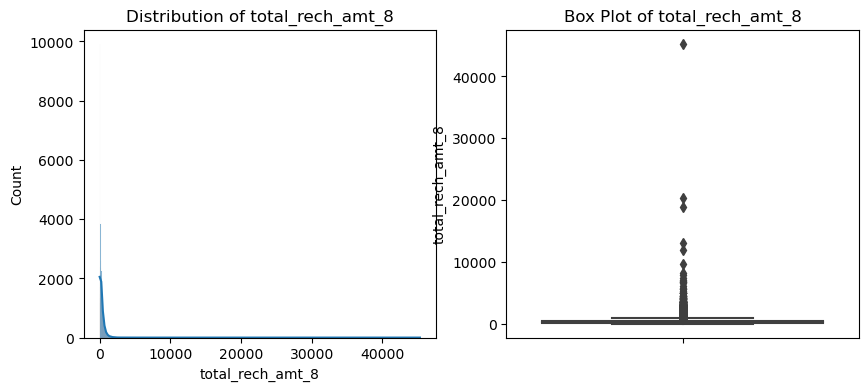

Column: total_rech_amt_6, Missing Data: 0.00%


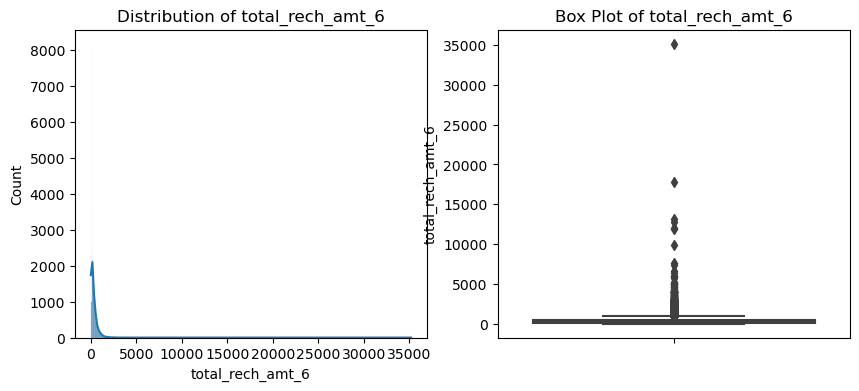

Column: total_rech_amt_7, Missing Data: 0.00%


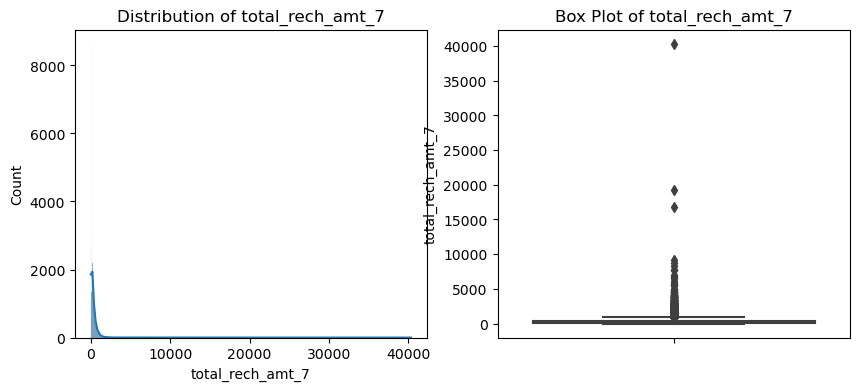

Column: total_ic_mou_8, Missing Data: 0.00%


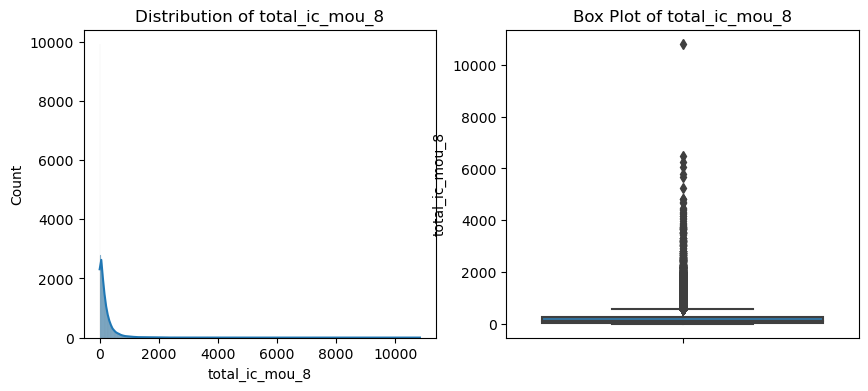

Column: total_ic_mou_7, Missing Data: 0.00%


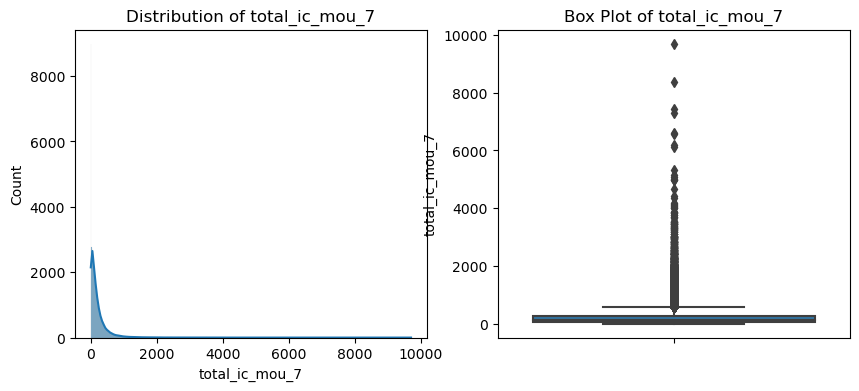

Column: total_ic_mou_6, Missing Data: 0.00%


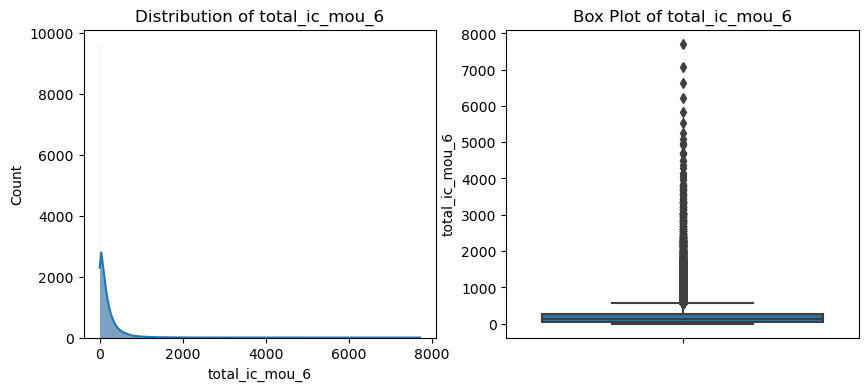

Column: total_og_mou_8, Missing Data: 0.00%


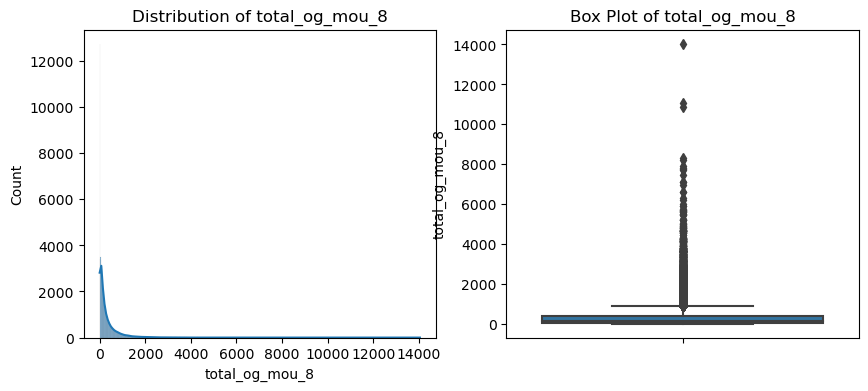

Column: total_og_mou_7, Missing Data: 0.00%


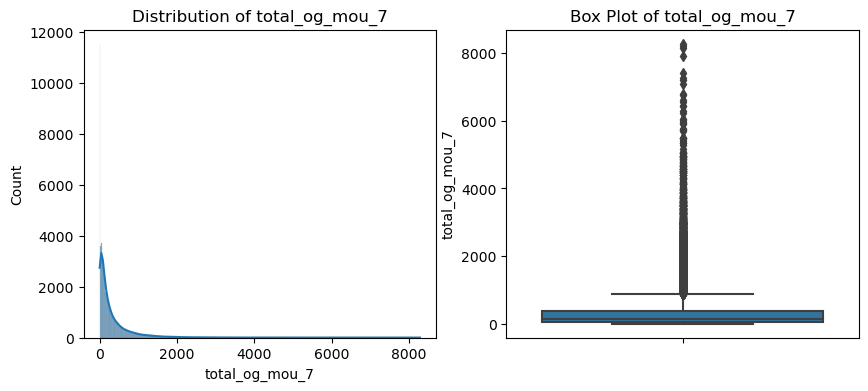

Column: total_og_mou_6, Missing Data: 0.00%


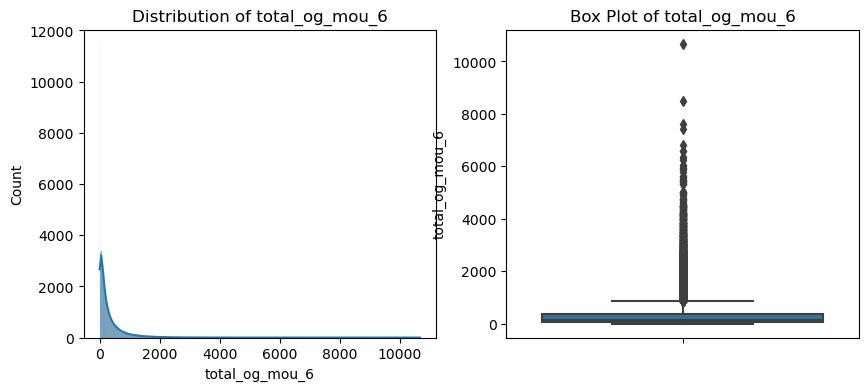

Column: offnet_mou_8, Missing Data: 0.00%


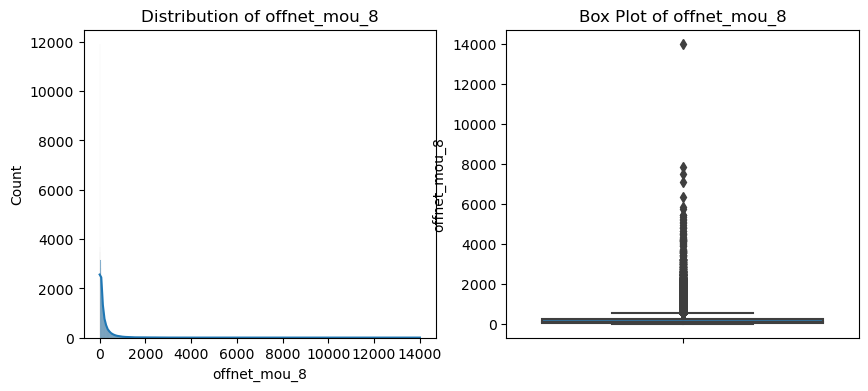

Column: offnet_mou_6, Missing Data: 0.00%


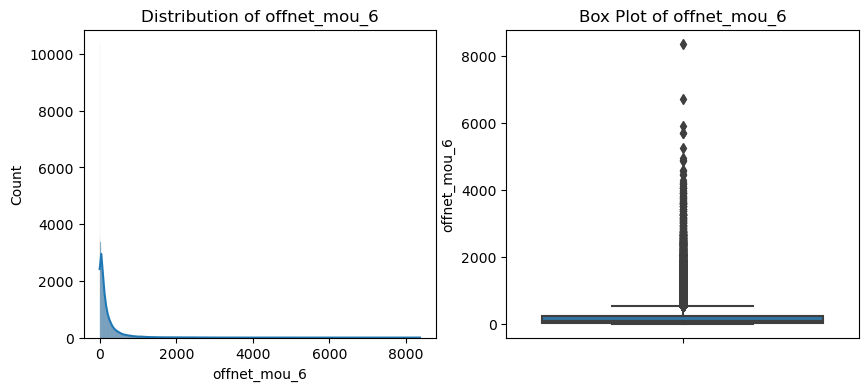

Column: offnet_mou_7, Missing Data: 0.00%


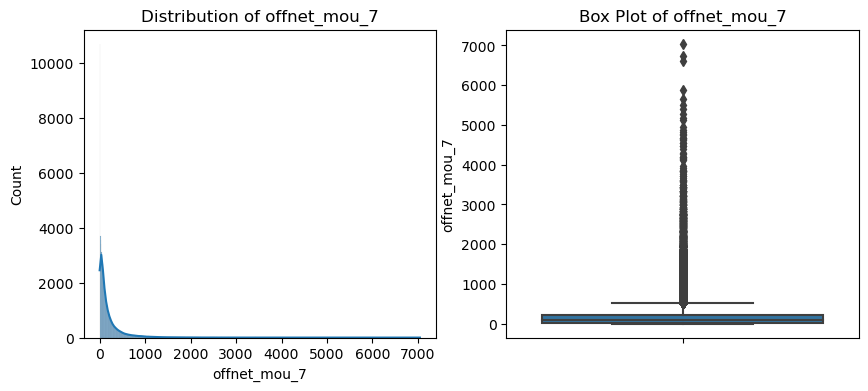

Column: vol_3g_mb_7, Missing Data: 0.00%


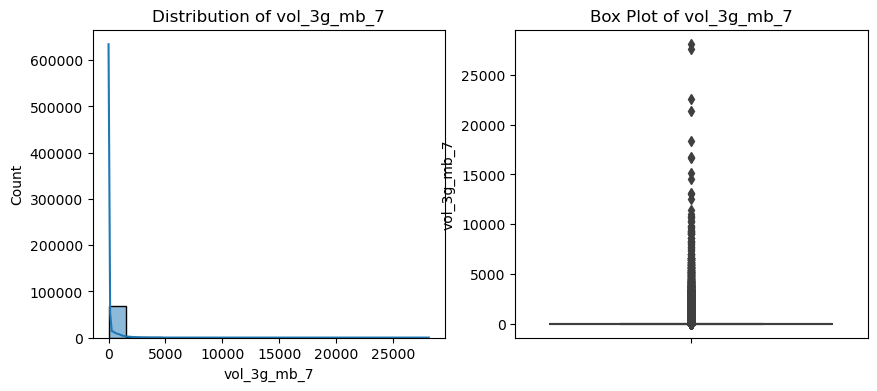

Column: vol_3g_mb_8, Missing Data: 0.00%


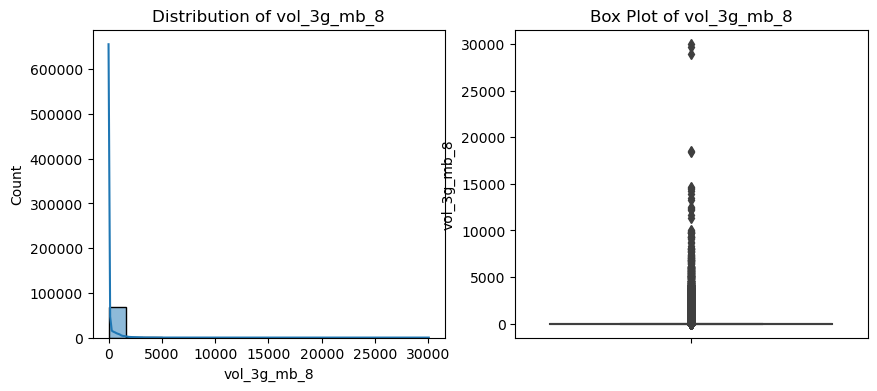

Column: vol_3g_mb_6, Missing Data: 0.00%


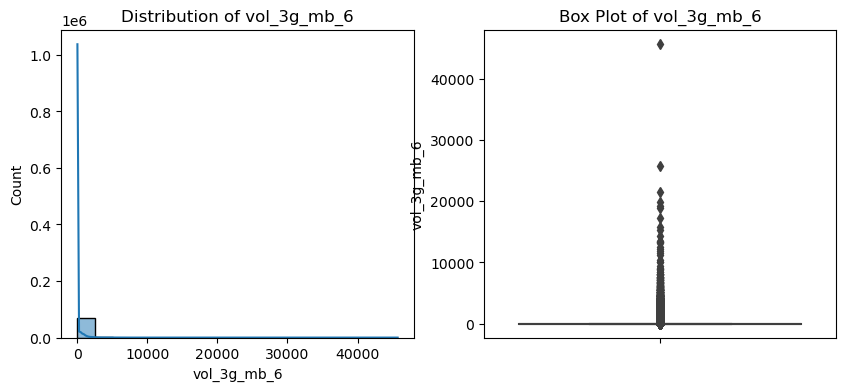

Column: vol_2g_mb_8, Missing Data: 0.00%


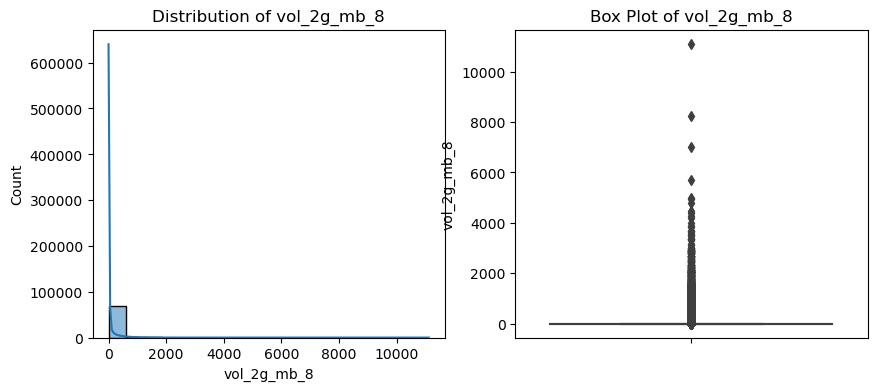

Column: vol_2g_mb_7, Missing Data: 0.00%


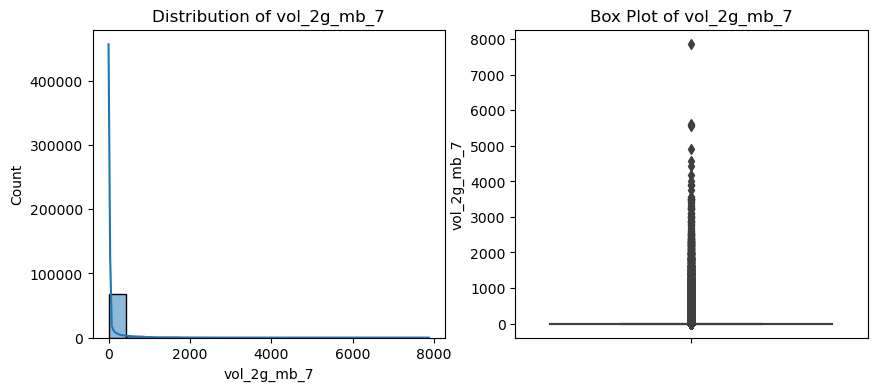

Column: vol_2g_mb_6, Missing Data: 0.00%


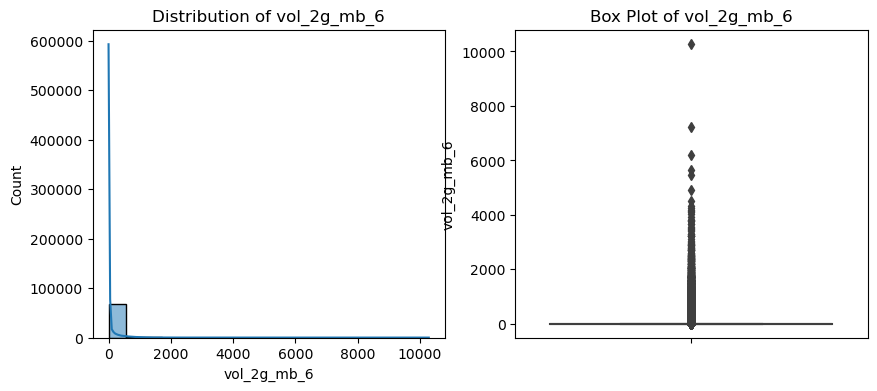

Column: aon, Missing Data: 0.00%


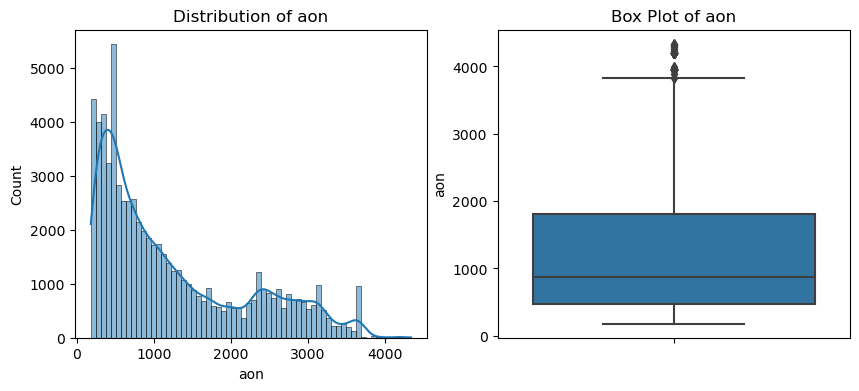

Column: churn_probability, Missing Data: 0.00%


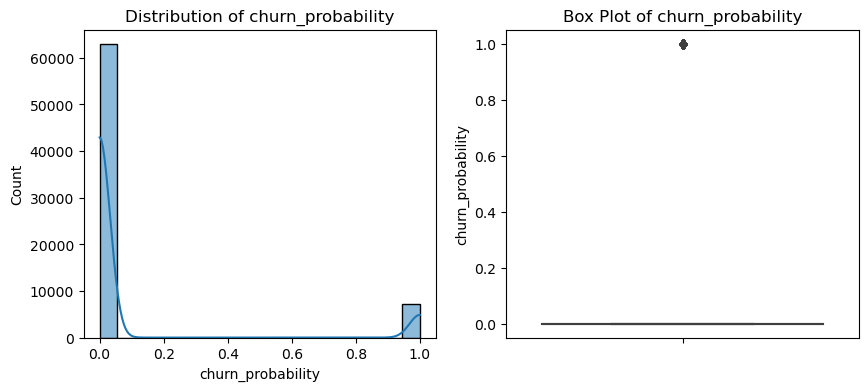

Column: night_pck_user_6, Missing Data: 0.00%


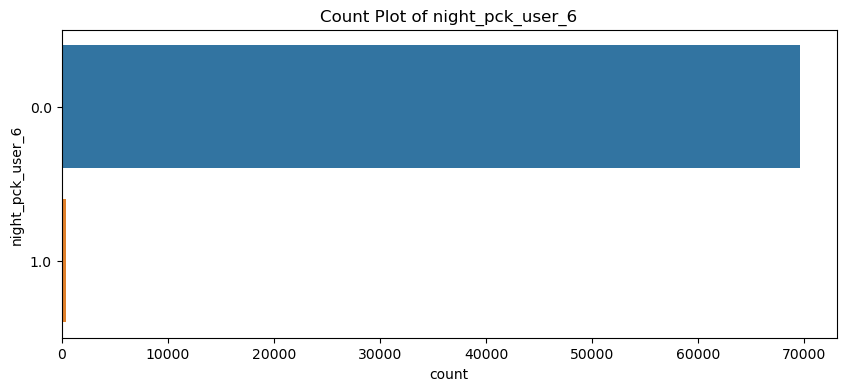

Column: night_pck_user_7, Missing Data: 0.00%


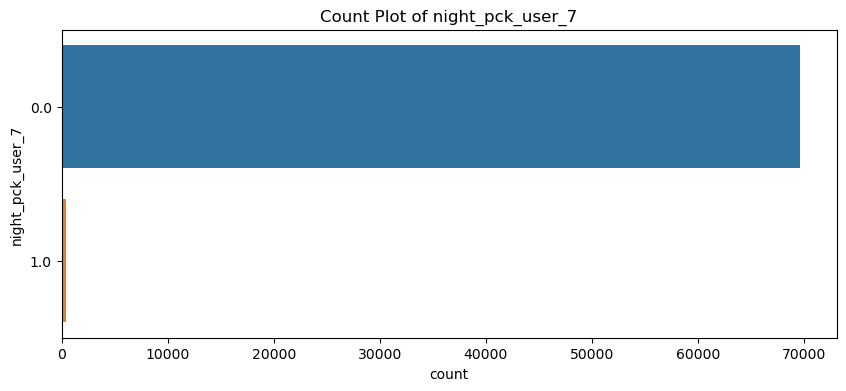

Column: night_pck_user_8, Missing Data: 0.00%


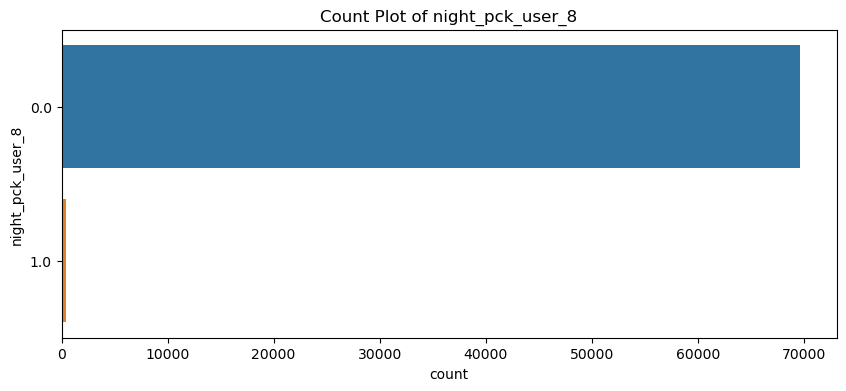

Column: fb_user_6, Missing Data: 0.00%


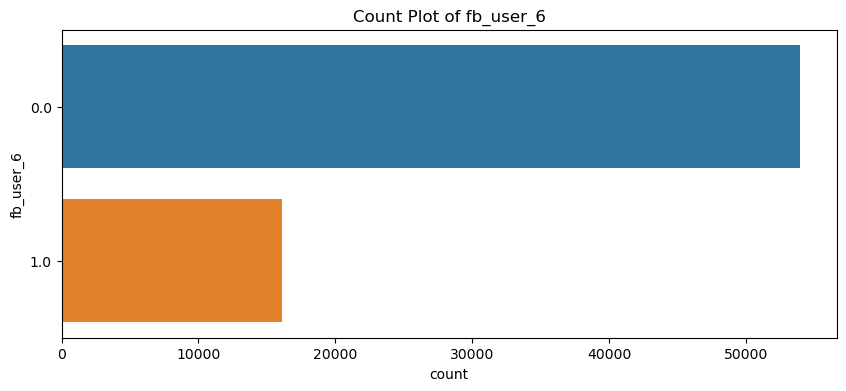

Column: fb_user_7, Missing Data: 0.00%


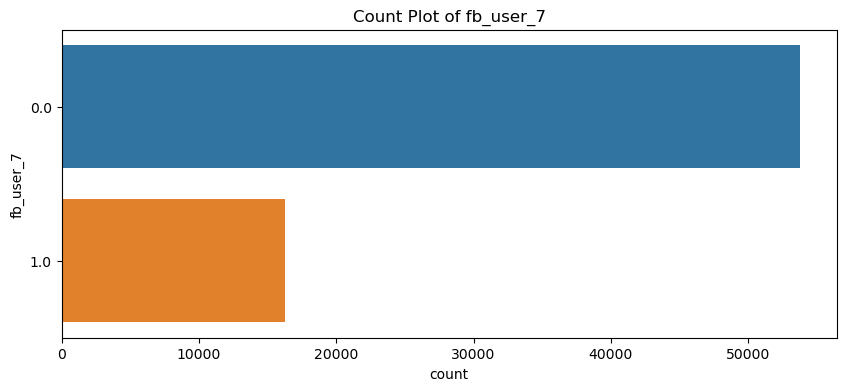

Column: fb_user_8, Missing Data: 0.00%


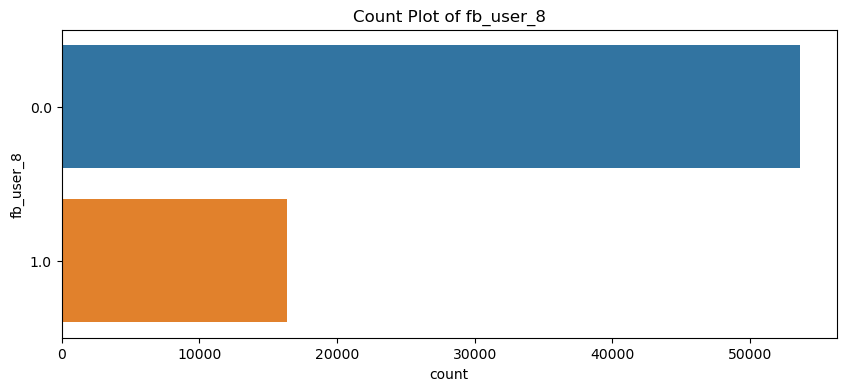

Column: month_present_7, Missing Data: 0.00%


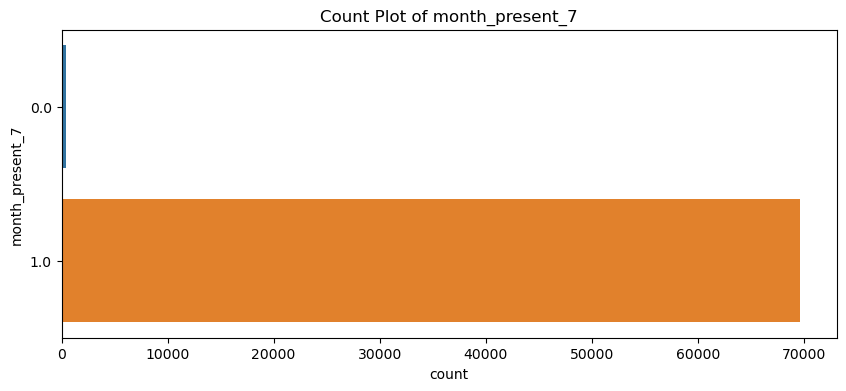

Column: month_present_8, Missing Data: 0.00%


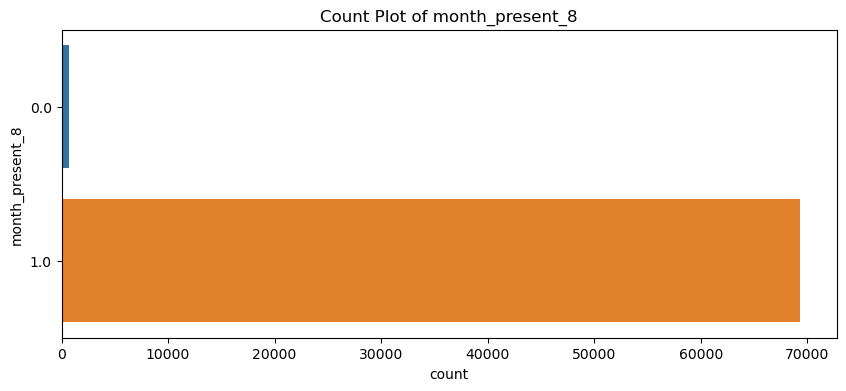

In [36]:
# Define a function for univariate analysis to draw the following only;

# distribution and box plot for numerical columns and;
# count plot for categorical columns

def univariate_analysis(df, column_list, plot_type='numerical'):
    for column in column_list:
        if column not in df.columns:
            print(f"Column {column} not found in dataframe.")
            continue

        missing_percentage = df[column].isna().sum() / len(df) * 100
        print(f"Column: {column}, Missing Data: {missing_percentage:.2f}%")

        if missing_percentage < 30:
            plt.figure(figsize=(10, 4))

            if plot_type == 'numerical':
                # Distribution plot for numerical data
                plt.subplot(1, 2, 1)
                sns.histplot(df[column].dropna(), kde=True)
                plt.title(f'Distribution of {column}')

                plt.subplot(1, 2, 2)
                sns.boxplot(y=df[column].dropna())
                plt.title(f'Box Plot of {column}')
            elif plot_type == 'categorical':
                # Count plot for categorical data
                sns.countplot(y=df[column].dropna())
                plt.title(f'Count Plot of {column}')
            
            plt.show()
        else:
            print(f"Skipping {column} due to high percentage of missing data.")

univariate_analysis(data_refined_1, numeric_cols, plot_type='numerical')
univariate_analysis(data_refined_1, categorical_cols, plot_type='categorical')

#### Bivariate analysis

night_pck_user_6


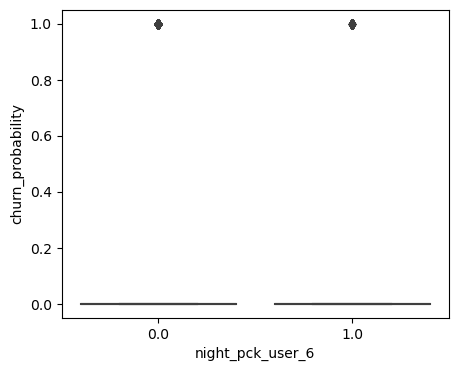

night_pck_user_7


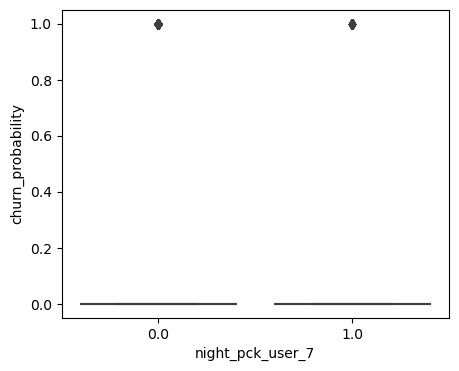

night_pck_user_8


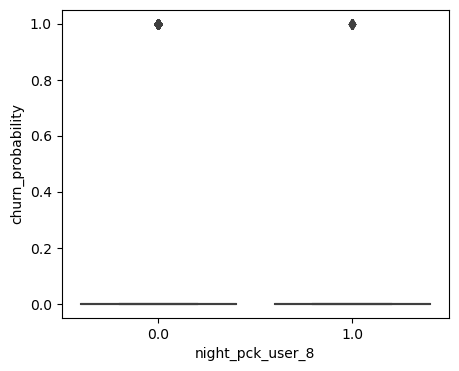

fb_user_6


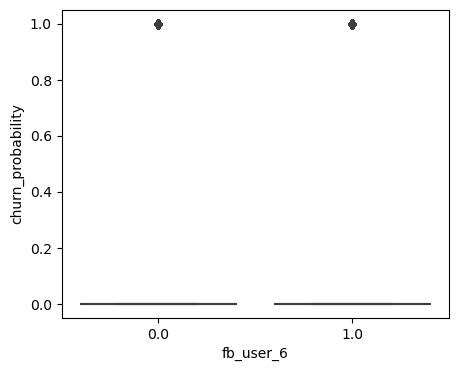

fb_user_7


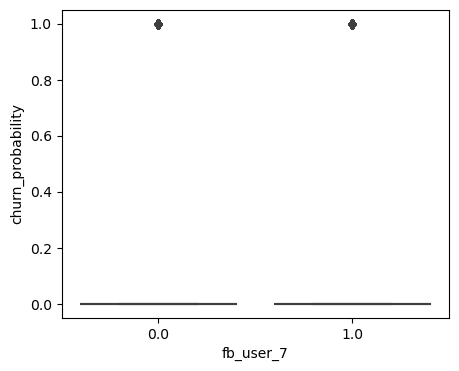

fb_user_8


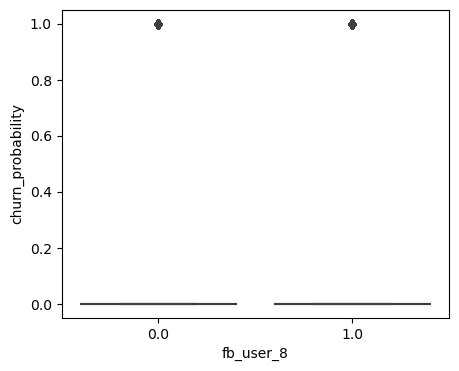

month_present_7


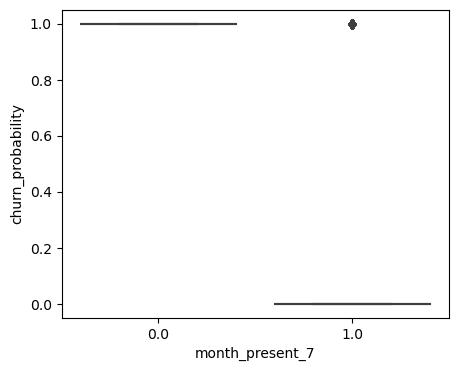

month_present_8


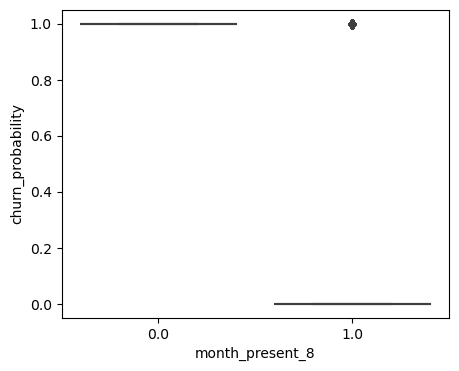

In [37]:
# Bivariate analysis - Box plots for all categorical predictor variables against the target variable saleprice

for col1 in categorical_cols:
        print(col1)
        plt.figure(figsize=(5, 4))
        sns.boxplot(x=col1,y='churn_probability', data = data_refined_1)
        plt.show()

#### Key observation: Churn probability is always 1 for where months present 7 and 8 are 0. 

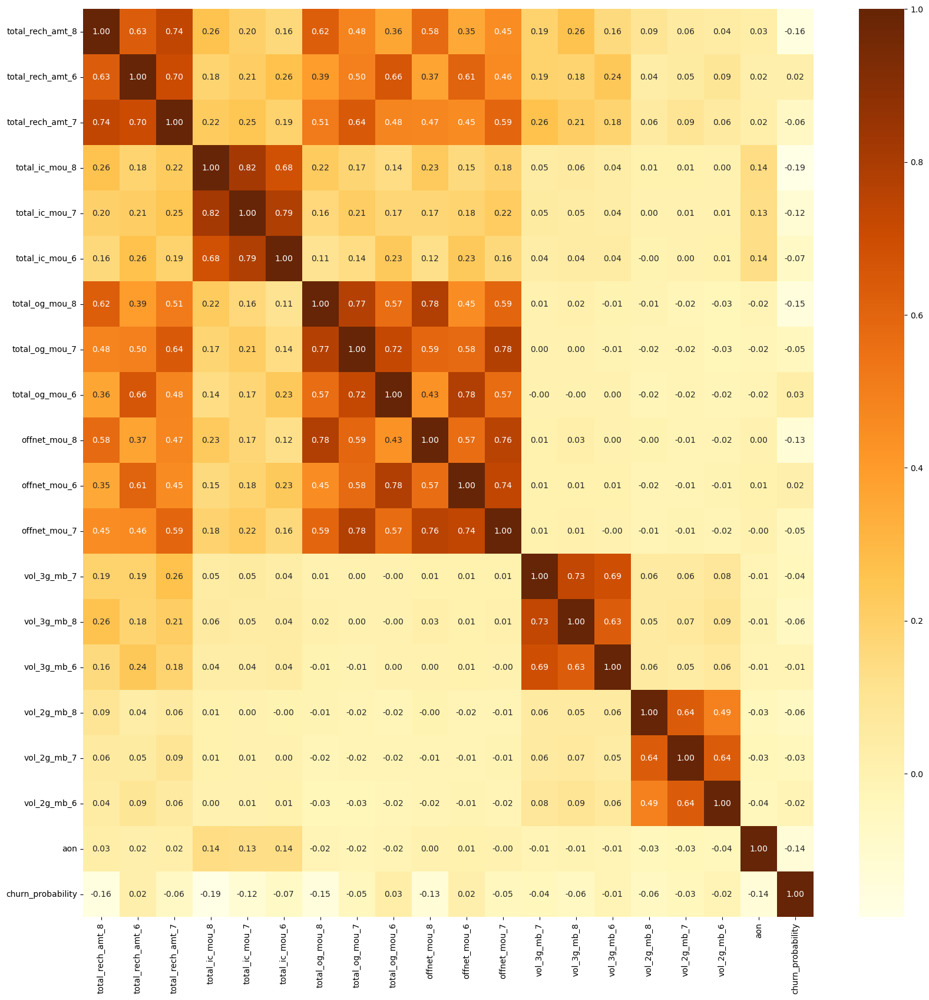

In [38]:
# Correlations
plt.figure(figsize=(20,20))
sns.heatmap(data_refined_1[numeric_cols].corr(),annot=True,fmt='.2f',cmap="YlOrBr")
plt.show()

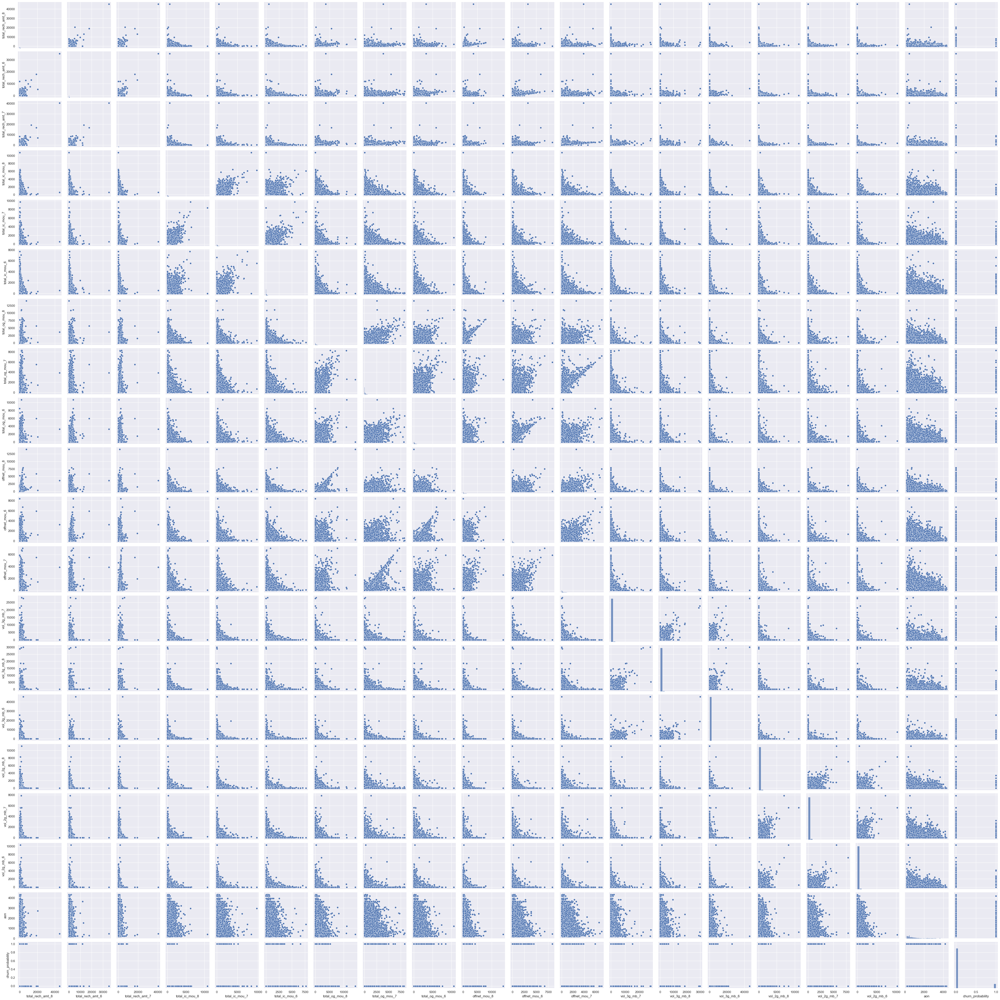

In [39]:
# Pairplots 
sns.set()
sns.pairplot(data=data_refined_1,vars=numeric_cols, size=2.5)
plt.show()

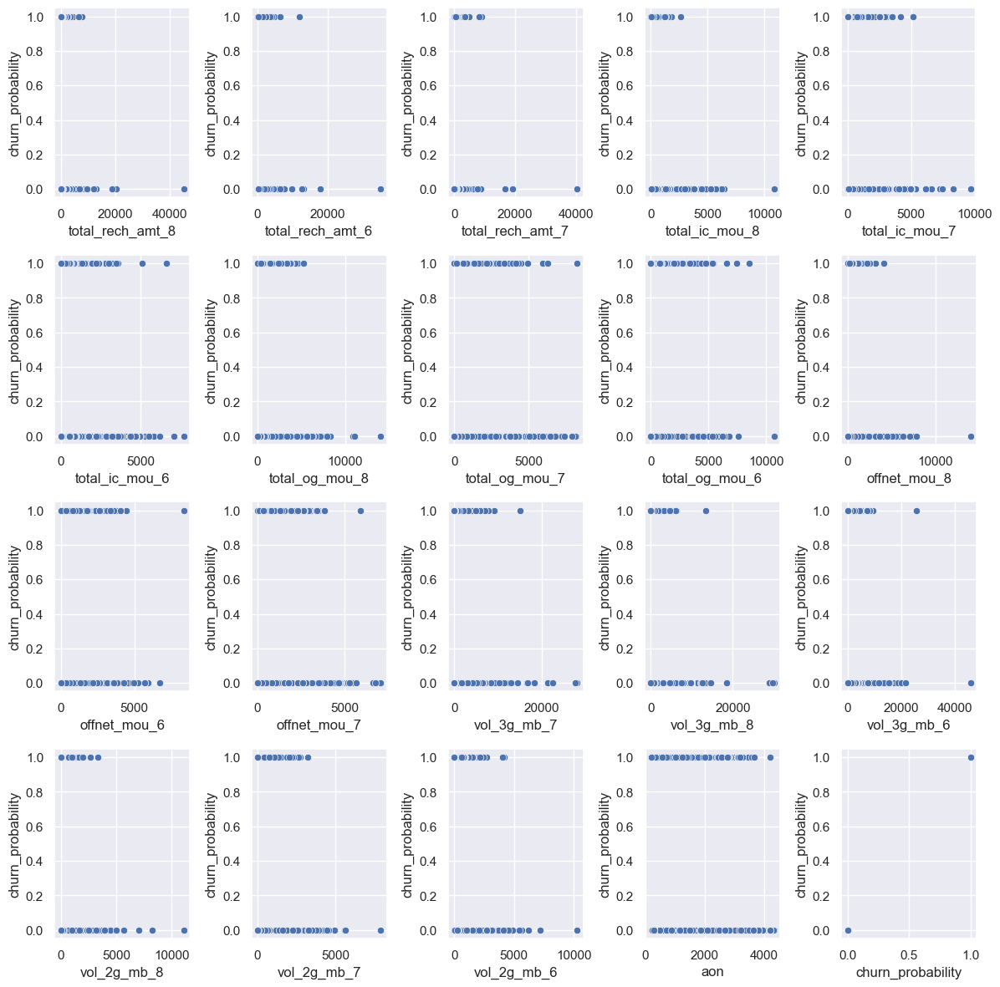

In [40]:
#Check the impact of these columns with SalePrice for predictive ability

fig=plt.subplots(figsize=(12, 12))

for i, col in enumerate(numeric_cols):
    plt.subplot(4, 5, i+1)
    plt.subplots_adjust(hspace = 4.0)
    sns.scatterplot(x=data_refined_1[col],y=data_refined_1['churn_probability'])
    plt.tight_layout()

#### Next Steps in the analysis and modelling

1. Calculate differences in recharge amounts and counts between the months 6(good phase) and 7 (action phase)
2. Drop columns related to the churn month (_8) from the analysis
3. Perform EDA again following these changes
4. Standard Scaler
5. PCA
6. Build models (start with Logistic Regression)
7. Before predicting on test data, apply all the data transformation including scaling & PCA on test data too.
8. Predictions
9. Model evaluations


In [41]:
# Converting the dates to recency and finally converting them to numerical variables:
#import datetime as dt
#for i in other_variables:
 #   data_refined_1[i]=pd.to_datetime(data_refined_1[i],format='%m/%d/%Y')
    
 #   data_refined_1['recency_'+i]=data_refined_1[i].max()-data_refined_1[i]
 #   data_refined_1['recency_'+i]=data_refined_1['recency_'+i].dt.days
 #   data_refined_1=data_refined_1.drop(i,axis=1)

    


In [42]:
# Removing the columns which do not have any variance:
#cols=data_refined_1.describe().columns
#cols=cols[(np.array(data_refined_1.describe()['std':])!=0)[0]]
#data_final=data_refined_1[cols]

In [43]:
# Having a final look at the info of the data:
#data_final.info(verbose=1)

#### Scaling:

In [44]:
# Using SimpleImputer to impute the data with median values:
#from sklearn.impute import SimpleImputer
#imputer=SimpleImputer(strategy='median')
#arr=imputer.fit_transform(data_final)

In [45]:
# Scaling the data:

from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
arr_scaled=scaler.fit_transform(data_refined_1)
df=pd.DataFrame(arr_scaled)
df.columns=data_refined_1.columns

# All the columns are now numeric columns:
num_variables=list(df.columns)
num_variables

['loc_ic_t2t_mou_8',
 'loc_ic_mou_8',
 'std_ic_t2m_mou_8',
 'loc_og_t2m_mou_8',
 'std_og_t2f_mou_8',
 'std_ic_t2t_mou_8',
 'loc_og_t2f_mou_8',
 'std_og_t2m_mou_8',
 'loc_og_t2c_mou_8',
 'og_others_8',
 'loc_ic_t2f_mou_8',
 'loc_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_ic_t2m_mou_8',
 'std_og_mou_8',
 'std_ic_mou_8',
 'std_ic_t2f_mou_8',
 'roam_og_mou_8',
 'spl_og_mou_8',
 'roam_ic_mou_8',
 'spl_ic_mou_8',
 'offnet_mou_8',
 'isd_ic_mou_8',
 'onnet_mou_8',
 'isd_og_mou_8',
 'ic_others_8',
 'std_og_t2t_mou_8',
 'loc_ic_t2t_mou_6',
 'spl_og_mou_6',
 'og_others_6',
 'std_ic_t2f_mou_6',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2f_mou_6',
 'loc_ic_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'std_ic_mou_6',
 'spl_ic_mou_6',
 'isd_ic_mou_6',
 'ic_others_6',
 'isd_og_mou_6',
 'loc_og_t2f_mou_6',
 'std_og_t2f_mou_6',
 'roam_og_mou_6',
 'std_og_t2m_mou_6',
 'loc_og_t2t_mou_6',
 'loc_og_mou_6',
 'roam_ic_mou_6',
 'std_og_t2t_mou_6',
 'loc_og_t2c_mou_6',
 'offnet_mou_6',
 'loc_og_t2m_mou_6',
 'onnet_mou_6

In [47]:
def outlier_removal(arr,k):
    upper_limit=np.percentile(arr,80)
    lower_limit=np.percentile(arr,20)
    iqr=upper_limit-lower_limit
    arr=df[(arr>lower_limit-k*iqr) and (arr<upper_limit+k*iqr)]
    return arr

In [48]:
df.describe()

,loc_ic_t2t_mou_8,loc_ic_mou_8,std_ic_t2m_mou_8,loc_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2t_mou_8,loc_og_t2f_mou_8,std_og_t2m_mou_8,loc_og_t2c_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_og_mou_8,loc_og_t2t_mou_8,loc_ic_t2m_mou_8,std_og_mou_8,std_ic_mou_8,std_ic_t2f_mou_8,roam_og_mou_8,spl_og_mou_8,roam_ic_mou_8,spl_ic_mou_8,offnet_mou_8,isd_ic_mou_8,onnet_mou_8,isd_og_mou_8,ic_others_8,std_og_t2t_mou_8,loc_ic_t2t_mou_6,spl_og_mou_6,og_others_6,std_ic_t2f_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,isd_og_mou_6,loc_og_t2f_mou_6,std_og_t2f_mou_6,roam_og_mou_6,std_og_t2m_mou_6,loc_og_t2t_mou_6,loc_og_mou_6,roam_ic_mou_6,std_og_t2t_mou_6,loc_og_t2c_mou_6,offnet_mou_6,loc_og_t2m_mou_6,onnet_mou_6,std_og_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_7,roam_og_mou_7,std_og_mou_7,std_ic_mou_7,std_ic_t2m_mou_7,roam_ic_mou_7,spl_ic_mou_7,offnet_mou_7,isd_ic_mou_7,onnet_mou_7,ic_others_7,isd_og_mou_7,std_ic_t2f_mou_7,loc_og_t2f_mou_7,std_og_t2m_mou_7,loc_og_t2c_mou_7,spl_og_mou_7,loc_ic_mou_7,loc_og_mou_7,loc_ic_t2f_mou_7,std_og_t2t_mou_7,loc_ic_t2m_mou_7,std_og_t2f_mou_7,og_others_7,std_ic_t2t_mou_7,loc_ic_t2t_mou_7,vol_2g_mb_8,jul_vbc_3g,night_pck_user_6,aon,aug_vbc_3g,jun_vbc_3g,vol_2g_mb_7,night_pck_user_7,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_6,vol_2g_mb_6,sachet_3g_6,night_pck_user_8,monthly_3g_8,fb_user_8,fb_user_7,fb_user_6,av_rech_amt_data_7,sachet_3g_8,sachet_3g_7,monthly_3g_7,monthly_2g_6,monthly_3g_6,sachet_2g_8,sachet_2g_7,sachet_2g_6,monthly_2g_8,monthly_2g_7,av_rech_amt_data_8,id,av_rech_amt_data_6,total_rech_amt_8,total_rech_amt_6,total_rech_num_8,total_rech_num_7,total_rech_num_6,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,arpu_8,arpu_7,arpu_6,total_rech_amt_7,max_rech_amt_6,count_rech_3g_8,max_rech_amt_7,count_rech_3g_7,count_rech_3g_6,count_rech_2g_8,count_rech_2g_7,count_rech_2g_6,max_rech_data_8,max_rech_data_7,max_rech_data_6,total_rech_data_8,total_rech_data_7,total_rech_data_6,last_day_rch_amt_8,last_day_rch_amt_7,last_day_rch_amt_6,max_rech_amt_8,churn_probability,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_7,month_present_8
count,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000
mean,0.0042,0.0146,0.0036,0.0174,0.0028,0.0024,0.0059,0.0062,0.0038,0.0001,0.0066,0.0121,0.0040

## EDA

### Univariate Analysis:

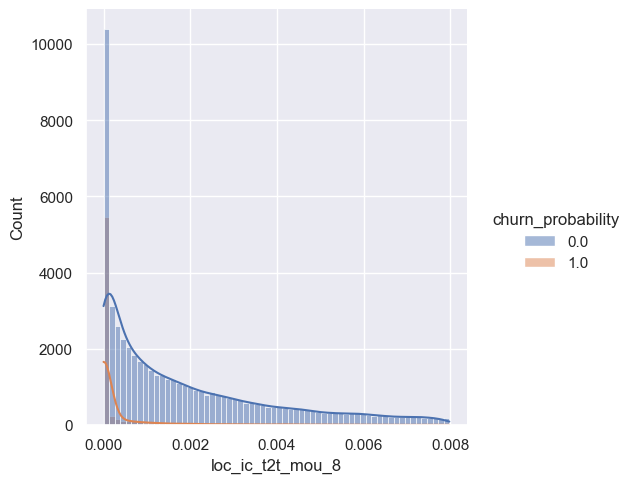

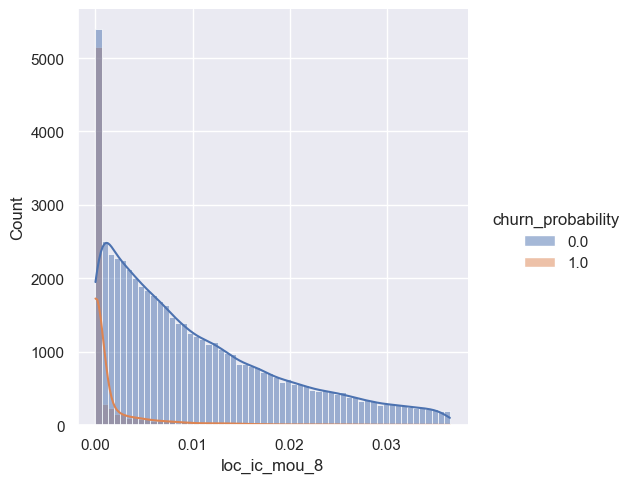

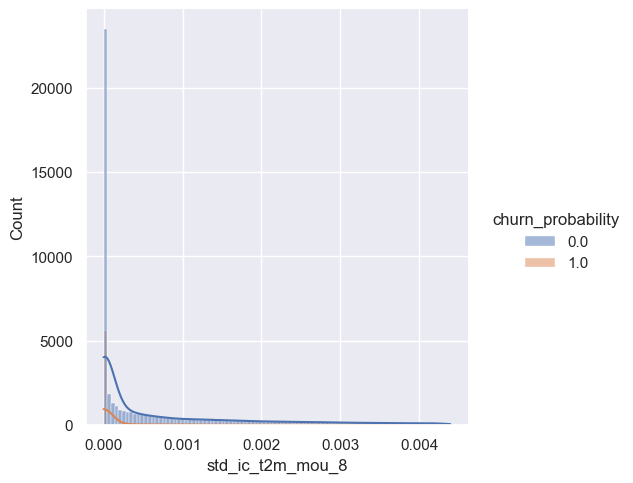

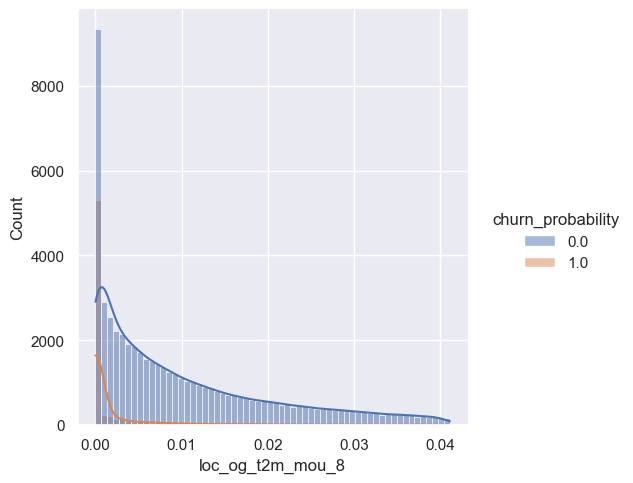

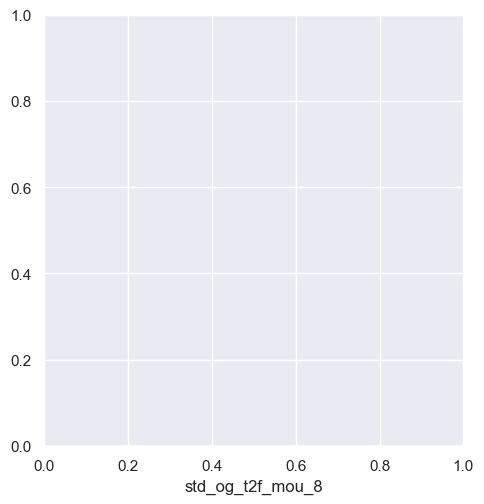

...

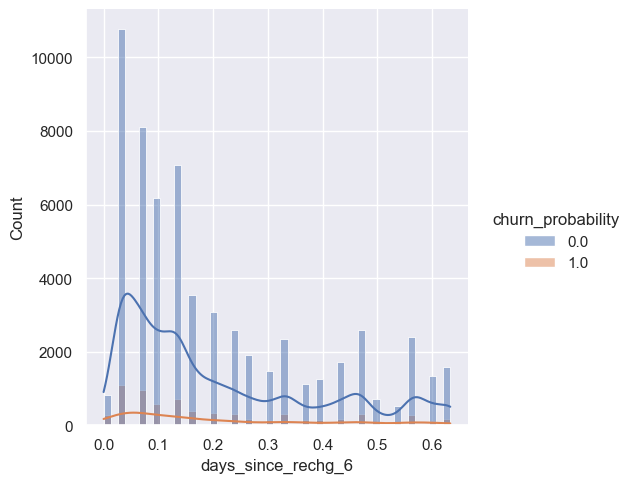

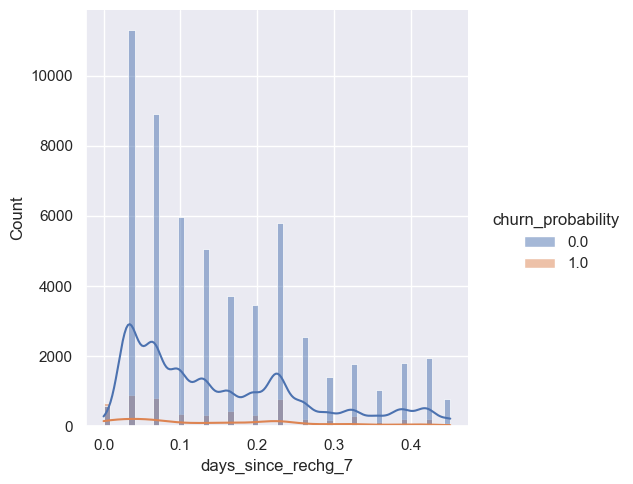

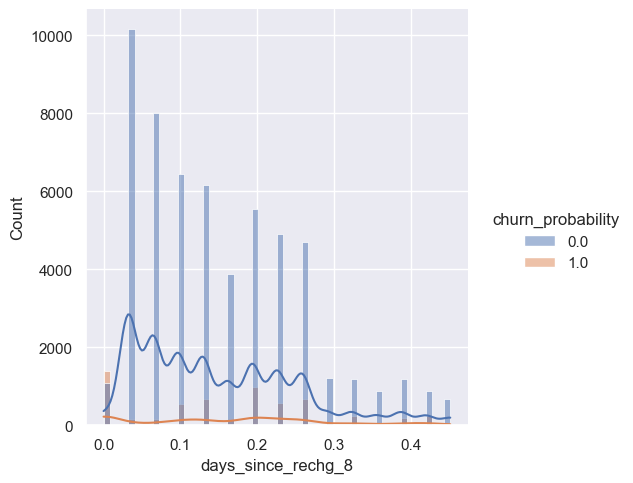

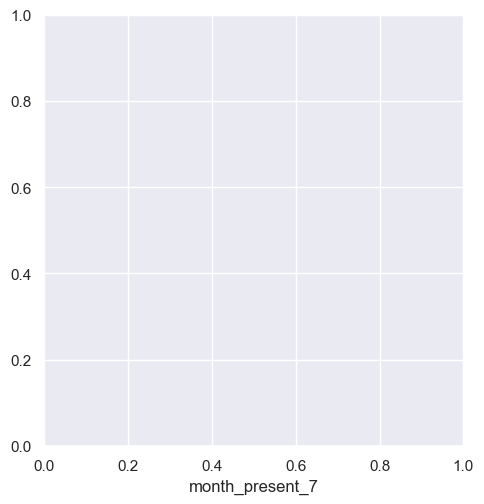

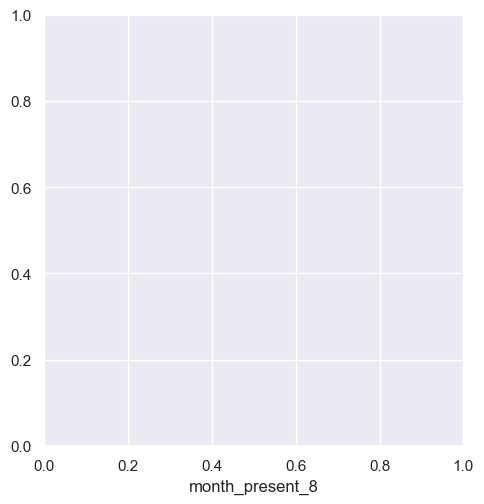

In [49]:
for i in num_variables:
    arr=np.array(df[i])
    uq=np.percentile(arr,70)
    lq=np.percentile(arr,20)
    iqr=uq-lq
    ul=uq+(1.5*iqr)
    ll=lq-(1.5*iqr)
    grouped_df=df[(df[i]<ul) & (df[i]>ll)]
    sns.displot(data=grouped_df,x=grouped_df[i],kde=True,hue='churn_probability')
    plt.xlabel(i)
    plt.show()

## Model Building:


In [52]:
# Splitting the data to X and y:
y=data_refined_1.pop('churn_probability')
X=data_refined_1


KeyError: 'churn_probability'

In [53]:
X

,loc_ic_t2t_mou_8,loc_ic_mou_8,std_ic_t2m_mou_8,loc_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2t_mou_8,loc_og_t2f_mou_8,std_og_t2m_mou_8,loc_og_t2c_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_og_mou_8,loc_og_t2t_mou_8,loc_ic_t2m_mou_8,std_og_mou_8,std_ic_mou_8,std_ic_t2f_mou_8,roam_og_mou_8,spl_og_mou_8,roam_ic_mou_8,spl_ic_mou_8,offnet_mou_8,isd_ic_mou_8,onnet_mou_8,isd_og_mou_8,ic_others_8,std_og_t2t_mou_8,loc_ic_t2t_mou_6,spl_og_mou_6,og_others_6,std_ic_t2f_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,isd_og_mou_6,loc_og_t2f_mou_6,std_og_t2f_mou_6,roam_og_mou_6,std_og_t2m_mou_6,loc_og_t2t_mou_6,loc_og_mou_6,roam_ic_mou_6,std_og_t2t_mou_6,loc_og_t2c_mou_6,offnet_mou_6,loc_og_t2m_mou_6,onnet_mou_6,std_og_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_7,roam_og_mou_7,std_og_mou_7,std_ic_mou_7,std_ic_t2m_mou_7,roam_ic_mou_7,spl_ic_mou_7,offnet_mou_7,isd_ic_mou_7,onnet_mou_7,ic_others_7,isd_og_mou_7,std_ic_t2f_mou_7,loc_og_t2f_mou_7,std_og_t2m_mou_7,loc_og_t2c_mou_7,spl_og_mou_7,loc_ic_mou_7,loc_og_mou_7,loc_ic_t2f_mou_7,std_og_t2t_mou_7,loc_ic_t2m_mou_7,std_og_t2f_mou_7,og_others_7,std_ic_t2t_mou_7,loc_ic_t2t_mou_7,vol_2g_mb_8,jul_vbc_3g,night_pck_user_6,aon,aug_vbc_3g,jun_vbc_3g,vol_2g_mb_7,night_pck_user_7,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_6,vol_2g_mb_6,sachet_3g_6,night_pck_user_8,monthly_3g_8,fb_user_8,fb_user_7,fb_user_6,av_rech_amt_data_7,sachet_3g_8,sachet_3g_7,monthly_3g_7,monthly_2g_6,monthly_3g_6,sachet_2g_8,sachet_2g_7,sachet_2g_6,monthly_2g_8,monthly_2g_7,av_rech_amt_data_8,id,av_rech_amt_data_6,total_rech_amt_8,total_rech_amt_6,total_rech_num_8,total_rech_num_7,total_rech_num_6,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,arpu_8,arpu_7,arpu_6,total_rech_amt_7,max_rech_amt_6,count_rech_3g_8,max_rech_amt_7,count_rech_3g_7,count_rech_3g_6,count_rech_2g_8,count_rech_2g_7,count_rech_2g_6,max_rech_data_8,max_rech_data_7,max_rech_data_6,total_rech_data_8,total_rech_data_7,total_rech_data_6,last_day_rch_amt_8,last_day_rch_amt_7,last_day_rch_amt_6,max_rech_amt_8,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_7,month_present_8
0,7.7900,24.7100,14.9600,2.3300,0.0000,0.2100,0.0000,0.0000,0.0000,0.0000,0.0000,2.6100,0.2800,16.9100,1.0100,15.1800,0.0000,0.0000,0.0000,0.0000,0.6600,2.3300,0.0000,1.2900,0.0000,0.0000,1.0100,2.4300,8.2000,0.3800,0.0000,0.8300,0.0000,3.2600,0.0000,7.4600,7.4600,0.0000,0.0000,1.1100,0.0000,0.0000,0.0000,0.0000,18.7500,2.2300,7.5300,0.0000,46.3400,0.0000,32.2400,5.2900,48.5800,65.0900,0.0000,16.0400,0.0000,204.9900,27.5800,19.9600,0.0000,0.0000,96.6800,0.0000,124.3800,0.6900,0.0000,0.0000,0.0000,80.6100,0.0000,0.6300,24.7600,16.0400,0.0000,124.3800,21.0800,0.0000,0.0000,7.6100,3.6800,0.0000,0.0000,0.0000,1958,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,0.0000,0,0.0000,0.0000,0.0000,0.0000,0,0,0,0,0,0,0,0,0,0,0.0000,0,0.0000,10,77,2,2,3,40.5600,53.0400,11.8400,3.6300,221.6800,81.2100,7.5270,87.0090,31.2770,65,65,0.0000,65,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,65,65,10,9.0000,22.0000,8.0000,1.0000,1.0000
1,10.5300,25.0300,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,29.7900,0.0000,3.4000,0.0000,0.0000,11.0900,0.0000,0.0000,0.0000,0.0000,31.6600,0.0000,0.0100,30.8900,0.0000,0.0000,0.0000,0.0000,0.0000,1.6800,0.0000,0.0000,0.0000,1.4100,0.3500,3.4400,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,25.9900,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,22.0100,30.7300,39.4400,0.0000,1.6600,0.0000,18.6800,0.0000,0.0000,0.0000,19.0900,0.0000,0.0000,0.0000,710,0.0000,0.0000,352.9100,0.0000,3.9600,0.0000,0.0000,0.0000,0,0.0000,0,0.0000,1.0000,0.0000,145.0000,0,0,1,0,0,0,0,0,0,0,0.0000,1,0.0000,50,0,5,4,3,25.0400,39.4400,3.4400,31.6600,30.7300,0.0000,42.9530,122.7870,0.00

In [54]:
# Importing all the dependencies:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score,precision_score,recall_score,auc,roc_curve


In [55]:
#Scaling the data:
scaler=MinMaxScaler()
X_scaled=scaler.fit_transform(X)
X_df=pd.DataFrame(X_scaled)
X_df.columns=X.columns
X_df

,loc_ic_t2t_mou_8,loc_ic_mou_8,std_ic_t2m_mou_8,loc_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2t_mou_8,loc_og_t2f_mou_8,std_og_t2m_mou_8,loc_og_t2c_mou_8,og_others_8,loc_ic_t2f_mou_8,loc_og_mou_8,loc_og_t2t_mou_8,loc_ic_t2m_mou_8,std_og_mou_8,std_ic_mou_8,std_ic_t2f_mou_8,roam_og_mou_8,spl_og_mou_8,roam_ic_mou_8,spl_ic_mou_8,offnet_mou_8,isd_ic_mou_8,onnet_mou_8,isd_og_mou_8,ic_others_8,std_og_t2t_mou_8,loc_ic_t2t_mou_6,spl_og_mou_6,og_others_6,std_ic_t2f_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,isd_og_mou_6,loc_og_t2f_mou_6,std_og_t2f_mou_6,roam_og_mou_6,std_og_t2m_mou_6,loc_og_t2t_mou_6,loc_og_mou_6,roam_ic_mou_6,std_og_t2t_mou_6,loc_og_t2c_mou_6,offnet_mou_6,loc_og_t2m_mou_6,onnet_mou_6,std_og_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_7,roam_og_mou_7,std_og_mou_7,std_ic_mou_7,std_ic_t2m_mou_7,roam_ic_mou_7,spl_ic_mou_7,offnet_mou_7,isd_ic_mou_7,onnet_mou_7,ic_others_7,isd_og_mou_7,std_ic_t2f_mou_7,loc_og_t2f_mou_7,std_og_t2m_mou_7,loc_og_t2c_mou_7,spl_og_mou_7,loc_ic_mou_7,loc_og_mou_7,loc_ic_t2f_mou_7,std_og_t2t_mou_7,loc_ic_t2m_mou_7,std_og_t2f_mou_7,og_others_7,std_ic_t2t_mou_7,loc_ic_t2t_mou_7,vol_2g_mb_8,jul_vbc_3g,night_pck_user_6,aon,aug_vbc_3g,jun_vbc_3g,vol_2g_mb_7,night_pck_user_7,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_6,vol_2g_mb_6,sachet_3g_6,night_pck_user_8,monthly_3g_8,fb_user_8,fb_user_7,fb_user_6,av_rech_amt_data_7,sachet_3g_8,sachet_3g_7,monthly_3g_7,monthly_2g_6,monthly_3g_6,sachet_2g_8,sachet_2g_7,sachet_2g_6,monthly_2g_8,monthly_2g_7,av_rech_amt_data_8,id,av_rech_amt_data_6,total_rech_amt_8,total_rech_amt_6,total_rech_num_8,total_rech_num_7,total_rech_num_6,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,arpu_8,arpu_7,arpu_6,total_rech_amt_7,max_rech_amt_6,count_rech_3g_8,max_rech_amt_7,count_rech_3g_7,count_rech_3g_6,count_rech_2g_8,count_rech_2g_7,count_rech_2g_6,max_rech_data_8,max_rech_data_7,max_rech_data_6,total_rech_data_8,total_rech_data_7,total_rech_data_6,last_day_rch_amt_8,last_day_rch_amt_7,last_day_rch_amt_6,max_rech_amt_8,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_7,month_present_8
0,0.0007,0.0023,0.0027,0.0005,0.0000,0.0001,0.0000,0.0000,0.0000,0.0000,0.0000,0.0002,0.0000,0.0027,0.0001,0.0027,0.0000,0.0000,0.0000,0.0000,0.0391,0.0002,0.0000,0.0001,0.0000,0.0000,0.0001,0.0005,0.0080,0.0005,0.0000,0.0002,0.0000,0.0004,0.0000,0.0013,0.0013,0.0000,0.0000,0.0008,0.0000,0.0000,0.0000,0.0000,0.0023,0.0003,0.0007,0.0000,0.0063,0.0000,0.0039,0.0011,0.0066,0.0077,0.0000,0.0035,0.0000,0.0251,0.0041,0.0032,0.0000,0.0000,0.0137,0.0000,0.0152,0.0005,0.0000,0.0000,0.0000,0.0122,0.0000,0.0003,0.0026,0.0021,0.0000,0.0153,0.0047,0.0000,0.0000,0.0016,0.0004,0.0000,0.0000,0.0000,0.4277,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0002,0.0022,0.0145,0.0145,0.0176,0.0037,0.0055,0.0015,0.0003,0.0268,0.0076,0.0276,0.0378,0.0764,0.0016,0.0162,0.0000,0.0197,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0210,0.0162,0.0022,0.3000,0.7097,0.2581,1.0000,1.0000
1,0.0010,0.0023,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0847,0.0000,0.0020,0.0000,0.0000,0.0018,0.0000,0.0000,0.0000,0.0000,0.0294,0.0000,0.0006,0.0022,0.0000,0.0000,0.0000,0.0000,0.0000,0.0003,0.0000,0.0000,0.0000,0.0003,0.0002,0.0005,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0037,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0240,0.0130,0.0041,0.0000,0.0008,0.0000,0.0042,0.0000,0.0000,0.0000,0.0020,0.0000,0.0000,0.0000,0.1275,0.0000,0.0000,0.0448,0.0000,0.0001,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0332,0.0000,0.0000,0.0625,0.0000,0.

In [56]:
# Doing the test-train split:
X_train,X_test,y_train,y_test=train_test_split(X_df,y,train_size=0.7)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((48999, 151), (21000, 151), (48999,), (21000,))

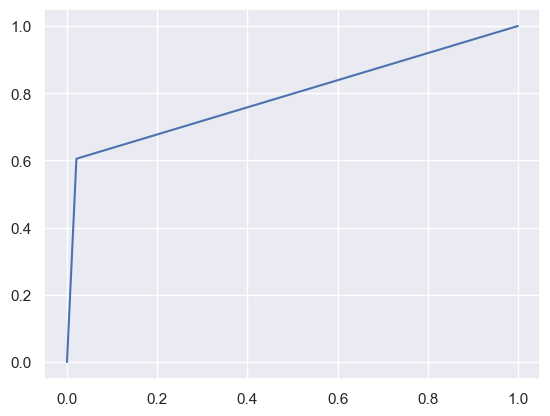

(0.9413333333333334, 0.7644603458556947, 0.7920409287557683)

In [57]:
#Applying the random forest classifer :
rf=RandomForestClassifier(random_state=42,max_depth=5)
rf.fit(X_train,y_train)
y_pred=rf.predict(X_test)
score=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
fpr,tpr,threshold=roc_curve(y_test,y_pred)
score_auc=auc(fpr,tpr)
plt.plot(fpr,tpr)
plt.show()
score,precision,score_auc


In [58]:
#Extracting the feature importances into a dataframe:
feature_dict=[]
for i in range(len(rf.feature_names_in_)):
    feature_dict.append((rf.feature_names_in_[i],rf.feature_importances_[i]))
feature_importance=pd.DataFrame(feature_dict,columns=['feature','importance']).sort_values(by='importance',ascending=False)
feature_importance

,feature,importance
1,loc_ic_mou_8,0.1153
13,loc_ic_t2m_mou_8,0.1143
118,total_ic_mou_8,0.1141
11,loc_og_mou_8,0.0659
0,loc_ic_t2t_mou_8,0.0558
124,arpu_8,0.0515
3,loc_og_t2m_mou_8,0.0497
121,total_og_mou_8,0.0484
145,max_rech_amt_8,0.0331
113,total_rech_amt_8,0.0317


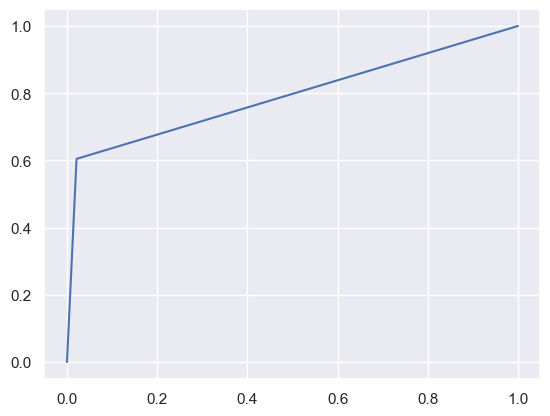

0.941047619047619 0.7620464009518144 0.7916725601560195


In [63]:
#Applying Decision Tree Classifier:
dt=DecisionTreeClassifier(random_state=42,max_depth=4)
dt.fit(X_train,y_train)
y_pred=dt.predict(X_test)
score=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
fpr,tpr,threshold=roc_curve(y_test,y_pred)
score_auc=auc(fpr,tpr)
plt.plot(fpr,tpr)
plt.show()
print(score,precision,score_auc)


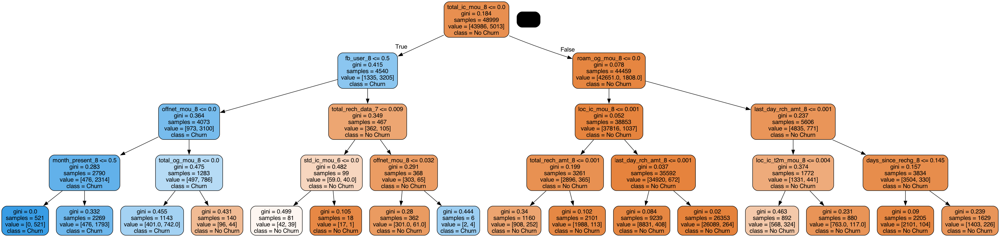

In [64]:
#Visualizing the decision tree graph:
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus,graphviz


dot_data=StringIO()
export_graphviz(dt,out_file=dot_data,filled=True,rounded=True,feature_names=X.columns,
                class_names=['No Churn','Churn'])
graph=pydotplus.graph_from_dot_data(dot_data.getvalue())

Image(graph.create_png())



In [69]:
#Extracting the feature importances into a dataframe:
feature_dict_dt=[]
for i in range(len(dt.feature_names_in_)):
    feature_dict_dt.append((dt.feature_names_in_[i],dt.feature_importances_[i]))
feature_importance_dt=pd.DataFrame(feature_dict_dt,columns=['feature','importance']).sort_values(by='importance',ascending=False)
Important_Features_dt=list(feature_importance_dt[feature_importance_dt['importance']>0].feature)

In [70]:
Important_Features_dt

['total_ic_mou_8',
 'fb_user_8',
 'roam_og_mou_8',
 'offnet_mou_8',
 'last_day_rch_amt_8',
 'loc_ic_mou_8',
 'loc_ic_t2m_mou_8',
 'total_rech_amt_8',
 'month_present_8',
 'total_og_mou_8',
 'days_since_rechg_8',
 'total_rech_data_7',
 'std_ic_mou_6']

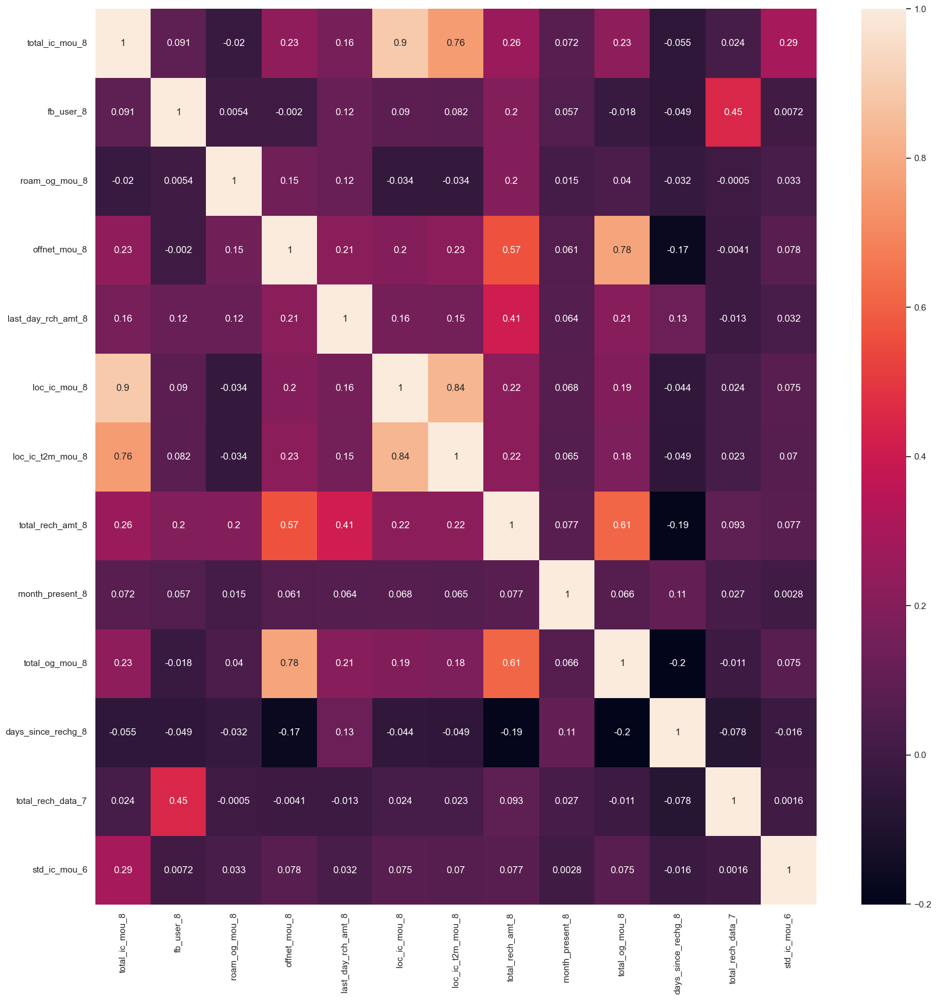

In [72]:
plt.figure(figsize=(20,20))
X_imp=X_train[Important_Features_dt]
sns.heatmap(X_imp.corr(),annot=True)
plt.show()

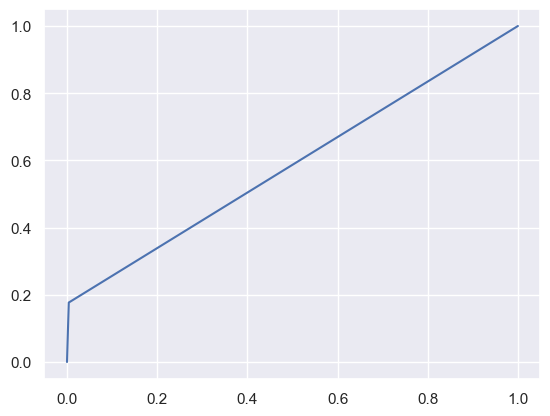

0.9133809523809524 0.8333333333333334 0.5864990108810706


In [74]:
# Applying Logistic Regression Clssifier:
lgm=LogisticRegression()
lgm.fit(X_train,y_train)
y_pred=lgm.predict(X_test)
score=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
fpr,tpr,threshold=roc_curve(y_test,y_pred)
plt.plot(fpr,tpr)
score_auc=auc(fpr,tpr)
plt.show()
print(score,precision,score_auc)

In [75]:
#Applying Logistic Regression using statsmodel in order to interpret better and find robust features:
import statsmodels.api as sm
from sklearn.feature_selection import RFE
lr=LogisticRegression()
rfe=RFE(lr,n_features_to_select=30)
rfe.fit(X_train,y_train)
list(zip(X_train.columns, rfe.support_, rfe.ranking_))
col = X_train.columns[rfe.support_]
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                48999
Model:                            GLM   Df Residuals:                    48968
Model Family:                Binomial   Df Model:                           30
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -10511.
Date:                Wed, 27 Mar 2024   Deviance:                       21023.
Time:                        23:11:08   Pearson chi2:                 2.82e+12
No. Iterations:                    26   Pseudo R-squ. (CS):             0.2064
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 53.0447   3.56e+04      0.001      0.999   -6.98e+04    6.99e+04
loc_ic_mou_8         -73.5345     10.161     -7.237      0.000     -93.449     -53.620
loc_og_t2m_mou_8     -17.8270      4.506     -3.956      0.000     -26.658      -8.996
loc_og_t2f_mou_8      -3.0402      2.735     -1.112      0.266      -8.401       2.320
loc_ic_t2f_mou_8     -32.1352      5.598     -5.741      0.000     -43.106     -21.164
loc_og_mou_8         -22.5856      8.866     -2.548      0.011     -39.962      -5.209
loc_ic_t2m_mou_8     -53.3167      7.778     -6.855      0.000     -68.562     -38.072
std_og_mou_8         -25.1490      8.466     -2.971      0.003     -41.741      -8.557
std_ic_mou_8         -20.0819      4.025     -4.989      0.000     -27.971     -12.192
roam_og_mou_8          9.2172      1.775      5.192      0.000       5.737      12.697
spl_og_mou_8         -12.5440      2.863     -4.381      0.000     -18.156      -6.932
roam_ic_mou_8          2.0731      1.117      1.855      0.064      -0.117       4.263
spl_ic_mou_8        -124.7259      9.162    -13.614      0.000    -142.682    -106.769
offnet_mou_8           0.9453      2.341      0.404      0.686      -3.642       5.533
roam_og_mou_6          4.2685      0.892      4.783      0.000       2.519       6.018
std_og_mou_6           2.2999      0.529      4.344      0.000       1.262       3.338
roam_og_mou_7          2.8952      0.905      3.200      0.001       1.122       4.669
std_og_mou_7           3.4181      0.610      5.601      0.000       2.222       4.614
spl_ic_mou_7         -12.1459      2.568     -4.730      0.000     -17.178      -7.114
loc_ic_t2m_mou_7       9.2149      1.302      7.075      0.000       6.662      11.768
monthly_2g_8          -5.2159      0.668     -7.810      0.000      -6.525      -3.907
total_rech_num_8     -10.1486      0.795    -12.766      0.000     -11.707      -8.590
total_rech_num_6       4.8770      0.523      9.326      0.000       3.852       5.902
total_ic_mou_8         3.4091      4.379      0.778      0.436      -5.174      11.993
total_og_mou_8        14.9563      8.690      1.721      0.085      -2.076      31.989
count_rech_2g_8        1.3115      2.742      0.478      0.632      -4.062       6.685
total_rech_data_8    -14.6702      3.295     -4.453      0.000     -21.127      -8.213
last_day_rch_amt_8   -25.5059      1.915    -13.320      0.000     -29.259     -21.753
max_rech_amt_8        -3.0623      1.200     -2.552      0.011      -5.414      -0.711
month_present_7      -26.8404   2.81e+04     -0.001      0.999   -5.51e+04    5.51e+04
month_present_8      -26.8137   2.19e+04     -0.001      0.999   -4.29e+04    4.28e+04
======================================================================================
"""

In [76]:
#Checking VIF for the above model:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = X_train_sm.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
24,total_og_mou_8,553.6500
7,std_og_mou_8,389.2700
0,const,170.0700
5,loc_og_mou_8,142.6800
23,total_ic_mou_8,19.9600
1,loc_ic_mou_8,18.4400
26,total_rech_data_8,6.5400
25,count_rech_2g_8,6.4200
6,loc_ic_t2m_mou_8,5.2000
2,loc_og_t2m_mou_8,4.0600


In [85]:
X_train_sm2=X_train_sm.drop(['loc_ic_t2m_mou_8','roam_ic_mou_8','total_og_mou_8','loc_ic_t2f_mou_8','month_present_8','total_ic_mou_8'
                           ,'loc_og_mou_8','count_rech_2g_8' ,'month_present_7','offnet_mou_8'],axis=1)

In [86]:
logm3 = sm.GLM(y_train,X_train_sm2, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                48999
Model:                            GLM   Df Residuals:                    48978
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11028.
Date:                Wed, 27 Mar 2024   Deviance:                       22057.
Time:                        23:14:34   Pearson chi2:                 1.01e+11
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1895
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.3456      0.033    -10.450      0.000      -0.410      -0.281
loc_ic_mou_8        -148.0353      5.380    -27.516      0.000    -158.580    -137.491
loc_og_t2m_mou_8     -26.8794      3.134     -8.576      0.000     -33.022     -20.736
loc_og_t2f_mou_8      -7.2362      2.874     -2.518      0.012     -12.868      -1.604
std_og_mou_8          -7.0807      1.555     -4.552      0.000     -10.129      -4.032
std_ic_mou_8         -19.7923      3.108     -6.368      0.000     -25.884     -13.700
roam_og_mou_8         12.5065      1.579      7.919      0.000       9.411      15.602
spl_og_mou_8         -11.9954      2.847     -4.214      0.000     -17.575      -6.416
spl_ic_mou_8        -128.7572      9.266    -13.896      0.000    -146.917    -110.597
roam_og_mou_6          4.0758      0.890      4.580      0.000       2.332       5.820
std_og_mou_6           1.7741      0.521      3.408      0.001       0.754       2.795
roam_og_mou_7          2.3107      0.909      2.543      0.011       0.530       4.092
std_og_mou_7           3.1795      0.605      5.257      0.000       1.994       4.365
spl_ic_mou_7         -13.9781      2.549     -5.485      0.000     -18.973      -8.983
loc_ic_t2m_mou_7       7.7469      1.250      6.199      0.000       5.298      10.196
monthly_2g_8          -5.4964      0.660     -8.327      0.000      -6.790      -4.203
total_rech_num_8     -13.5540      0.818    -16.570      0.000     -15.157     -11.951
total_rech_num_6       5.0658      0.522      9.698      0.000       4.042       6.090
total_rech_data_8    -13.5207      1.451     -9.316      0.000     -16.365     -10.676
last_day_rch_amt_8   -25.1034      1.870    -13.423      0.000     -28.769     -21.438
max_rech_amt_8        -4.4762      1.180     -3.794      0.000      -6.789      -2.164
======================================================================================
"""

In [87]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = X_train_sm2.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm2.values, i) for i in range(X_train_sm2.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,3.6800
12,std_og_mou_7,3.6800
4,std_og_mou_8,3.0600
10,std_og_mou_6,2.6300
16,total_rech_num_8,2.2100
20,max_rech_amt_8,2.1000
1,loc_ic_mou_8,2.0900
14,loc_ic_t2m_mou_7,2.0300
19,last_day_rch_amt_8,1.9500
11,roam_og_mou_7,1.8700


In [91]:
important_features_stats_model=list(vif.Features)
important_features_stats_model

['const',
 'std_og_mou_7',
 'std_og_mou_8',
 'std_og_mou_6',
 'total_rech_num_8',
 'max_rech_amt_8',
 'loc_ic_mou_8',
 'loc_ic_t2m_mou_7',
 'last_day_rch_amt_8',
 'roam_og_mou_7',
 'total_rech_num_6',
 'roam_og_mou_8',
 'loc_og_t2m_mou_8',
 'roam_og_mou_6',
 'total_rech_data_8',
 'loc_og_t2f_mou_8',
 'monthly_2g_8',
 'spl_og_mou_8',
 'std_ic_mou_8',
 'spl_ic_mou_8',
 'spl_ic_mou_7']

## Model excluding the month 8:

In [92]:
cols=data_refined_1.columns
for col in cols:
    if '8' in col:
        data_refined_1=data_refined_1.drop(col,axis=1)


In [93]:
X_2=data_refined_1
X_train_2,X_test_2,y_train,y_test=train_test_split(X_2,y,train_size=0.7)
X_train_2.shape,X_test_2.shape,y_train.shape,y_test.shape

((48999, 102), (21000, 102), (48999,), (21000,))

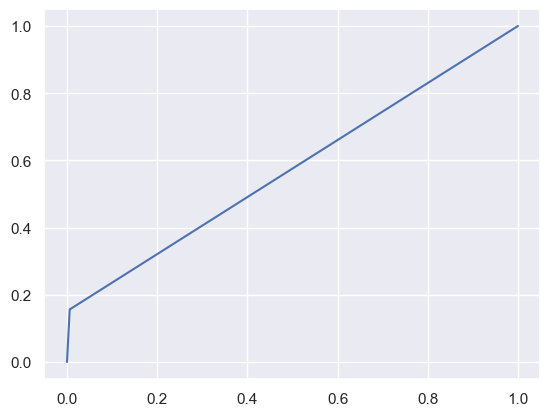

(0.9075238095238095, 0.7483443708609272, 0.5751921333383941)

In [94]:
rf=RandomForestClassifier(random_state=42,max_depth=5)
rf.fit(X_train_2,y_train)
y_pred=rf.predict(X_test_2)
score=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
fpr,tpr,threshold=roc_curve(y_test,y_pred)
score_auc=auc(fpr,tpr)
plt.plot(fpr,tpr)
plt.show()
score,precision,score_auc



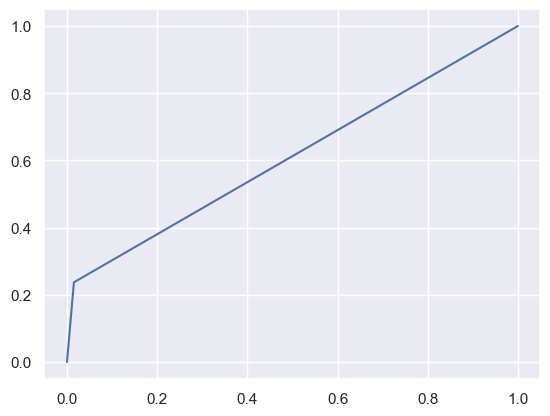

(0.9075238095238095, 0.6400996264009963, 0.6109244367299876)

In [95]:
dt=DecisionTreeClassifier(random_state=42,max_depth=5)
dt.fit(X_train_2,y_train)
y_pred=dt.predict(X_test_2)
score=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
fpr,tpr,threshold=roc_curve(y_test,y_pred)
score_auc=auc(fpr,tpr)
plt.plot(fpr,tpr)
plt.show()
score,precision,score_auc


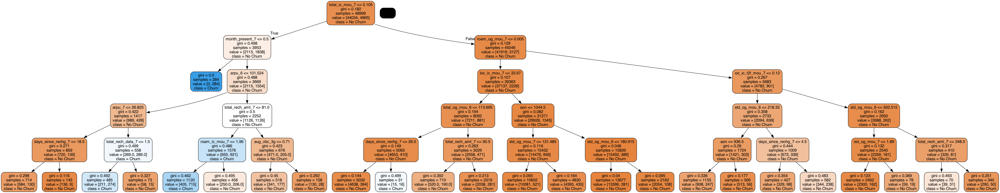

In [98]:
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus,graphviz


dot_data=StringIO()
export_graphviz(dt,out_file=dot_data,filled=True,rounded=True,feature_names=X_train_2.columns,
                class_names=['No Churn','Churn'])
graph=pydotplus.graph_from_dot_data(dot_data.getvalue())

Image(graph.create_png())



In [99]:
feature_dict=[]
for i in range(len(dt.feature_names_in_)):
    feature_dict.append((dt.feature_names_in_[i],dt.feature_importances_[i]))
feature_importance=pd.DataFrame(feature_dict,columns=['feature','importance']).sort_values(by='importance',ascending=False)
important_features_exclud_8=list(feature_importance[feature_importance['importance']>0].feature)
important_features_exclud_8

['total_ic_mou_7',
 'month_present_7',
 'total_rech_amt_7',
 'roam_og_mou_7',
 'arpu_7',
 'arpu_6',
 'loc_ic_t2f_mou_7',
 'loc_ic_mou_7',
 'std_og_mou_6',
 'aon',
 'days_since_rechg_7',
 'roam_ic_mou_7',
 'total_og_mou_6',
 'total_rech_data_7',
 'std_og_mou_7',
 'aug_vbc_3g',
 'isd_og_mou_7']

In [100]:
lr3=LogisticRegression()
rfe=RFE(lr3,n_features_to_select=30)
rfe.fit(X_train_2,y_train)

col = X_train_2.columns[rfe.support_]
X_train_sm_2 = sm.add_constant(X_train_2[col])
logm3 = sm.GLM(y_train,X_train_sm_2, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                48999
Model:                            GLM   Df Residuals:                    48968
Model Family:                Binomial   Df Model:                           30
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -13520.
Date:                Wed, 27 Mar 2024   Deviance:                       27041.
Time:                        23:18:50   Pearson chi2:                 2.05e+07
No. Iterations:                    24   Pseudo R-squ. (CS):            0.09888
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 25.4678   1.27e+04      0.002      0.998   -2.48e+04    2.49e+04
std_ic_t2f_mou_6       0.0004      0.002      0.184      0.854      -0.004       0.005
isd_ic_mou_6           0.0006      0.000      2.388      0.017       0.000       0.001
isd_og_mou_6          -0.0061      0.001     -7.177      0.000      -0.008      -0.004
std_og_t2f_mou_6      -0.0069      0.004     -1.651      0.099      -0.015       0.001
loc_og_t2c_mou_6      -0.0038      0.003     -1.143      0.253      -0.010       0.003
roam_og_mou_7          0.0013      0.000      6.045      0.000       0.001       0.002
std_ic_t2f_mou_7      -0.0062      0.003     -1.930      0.054      -0.012    9.69e-05
loc_og_t2c_mou_7       0.0031      0.002      1.283      0.199      -0.002       0.008
loc_ic_mou_7         -72.8551      2.949    -24.703      0.000     -78.635     -67.075
loc_og_mou_7          -0.0016      0.000     -8.409      0.000      -0.002      -0.001
loc_ic_t2f_mou_7      72.8510      2.949     24.700      0.000      67.070      78.632
loc_ic_t2m_mou_7      72.8517      2.949     24.702      0.000      67.071      78.632
std_og_t2f_mou_7      -0.0025      0.004     -0.550      0.583      -0.011       0.006
loc_ic_t2t_mou_7      72.8549      2.949     24.703      0.000      67.075      78.635
jul_vbc_3g             0.0006      0.000      5.349      0.000       0.000       0.001
aug_vbc_3g            -0.0023      0.000    -10.971      0.000      -0.003      -0.002
sachet_2g_7            0.4896      0.085      5.748      0.000       0.323       0.656
total_rech_num_7      -0.0212      0.004     -5.812      0.000      -0.028      -0.014
total_rech_num_6       0.0211      0.003      6.072      0.000       0.014       0.028
arpu_6                 0.0010   8.09e-05     12.674      0.000       0.001       0.001
max_rech_amt_7      1.135e-05      0.000      0.055      0.956      -0.000       0.000
count_rech_2g_7       -0.4834      0.089     -5.456      0.000      -0.657      -0.310
count_rech_2g_6       -0.0380      0.036     -1.043      0.297      -0.109       0.033
total_rech_data_7     -0.0582      0.032     -1.843      0.065      -0.120       0.004
total_rech_data_6      0.0329      0.031      1.052      0.293      -0.028       0.094
last_day_rch_amt_7    -0.0017      0.000     -6.080      0.000      -0.002      -0.001
last_day_rch_amt_6    -0.0004      0.000     -1.910      0.056      -0.001    1.13e-05
days_since_rechg_6    -0.0104      0.003     -3.568      0.000      -0.016      -0.005
days_since_rechg_7     0.0333      0.003     12.471      0.000       0.028       0.039
month_present_7      -27.0599   1.27e+04     -0.002      0.998   -2.49e+04    2.48e+04
======================================================================================
"""

In [101]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = X_train_sm_2.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm_2.values, i) for i in range(X_train_sm_2.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,loc_ic_mou_7,1613169139.1500
12,loc_ic_t2m_mou_7,663182776.5300
14,loc_ic_t2t_mou_7,555084646.8300
11,loc_ic_t2f_mou_7,50304413.1800
0,const,181.5700
22,count_rech_2g_7,40.6300
17,sachet_2g_7,33.5100
24,total_rech_data_7,12.5300
25,total_rech_data_6,12.2800
23,count_rech_2g_6,12.0500
